In [1]:
%load_ext autoreload
%load_ext rpy2.ipython
%autoreload 2

import logging
import math

import colorcet
import matplotlib
import numpy as np
import pandas
import plotly
import seaborn
from matplotlib import pyplot
from networkx import spring_layout, get_edge_attributes, degree
from rpy2.robjects import numpy2ri
from sklearn.datasets import make_blobs
# noinspection PyUnresolvedReferences
from sklearn.experimental import enable_iterative_imputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from statsmodels.graphics.gofplots import qqplot
from toolz import compose

from clustering import GaussianMixtureProtocol, map_y_pred_by_prevalence, sort_y_proba_by_prevalence, get_instances_per_cluster
from formatting import format_feature_short, format_percents
from functional import flatten, find_index
from functional import mapl
from network_analysis import draw_graph, get_graph_low_threshold
from data import datasets_all
from correlation_heatmap import plot_correlation_heatmap
from utils import assert_equals
from utils import is_first_column, is_last_row
from visualisation import plot_style, display_html
from visualisation import savefig

N_CLUSTERS = 3
PLOTLY_STYLE = 'plotly'
BASE_DATASET = datasets_all
EXPORT_FORMAT = 'png'
EXPORT = False
TEST = False

plot_folder = './output'

matplotlib.rcParams['figure.dpi'] = 200
numpy2ri.activate()
pandas.set_option('display.max_rows', 500)
plotly.io.orca.config.executable = './node_modules/.bin/orca'
seaborn.set()

if EXPORT:
    logging.getLogger().setLevel(logging.ERROR)

display_html('<style> td { font-size: 150% }</style>')

X = BASE_DATASET['varsellcm']
X_all = BASE_DATASET['clustering']
X_biclustering = X_correlated_removed = BASE_DATASET['clustering_correlated_removed']
y_true = BASE_DATASET['y_true']
column_order_for_biclustering = [
    # M-mode measurements
    'AO_DIAM',
    'IVSD',
    'LVIDD',
    'LVPWD',
    'LVMI',
    'RWT',
    # 2D measurements
    'ESV_MODI',
    'SV_MODI',
    'EF_MOD',
    'LA_EF_4CH',
    'LA_A_4CH',
    'LAEDVI',
    'LAESVI',
    'LA_ADI',
    'LA_ASI',
    'LA_GS',
    # Classical Doppler measurements
    'MVE_VEL',
    'MVA_VEL',
    'RMVEA',
    'MV_DECT',
    'IVRT',
    # Tissue Doppler measurements
    'AM',
    'EM',
    'SM',
    'REAM',
    'REEM',
    # Blood pressure
    'PP',
    'SBP',
    'PR',
    # 2D strain measurements
    'GS'
]


## Model selection

### Histograms per variable

/tmp/ipykernel_369144/3667674923.py:2: UserWarning:

To output multiple subplots, the figure containing the passed axes is being cleared.



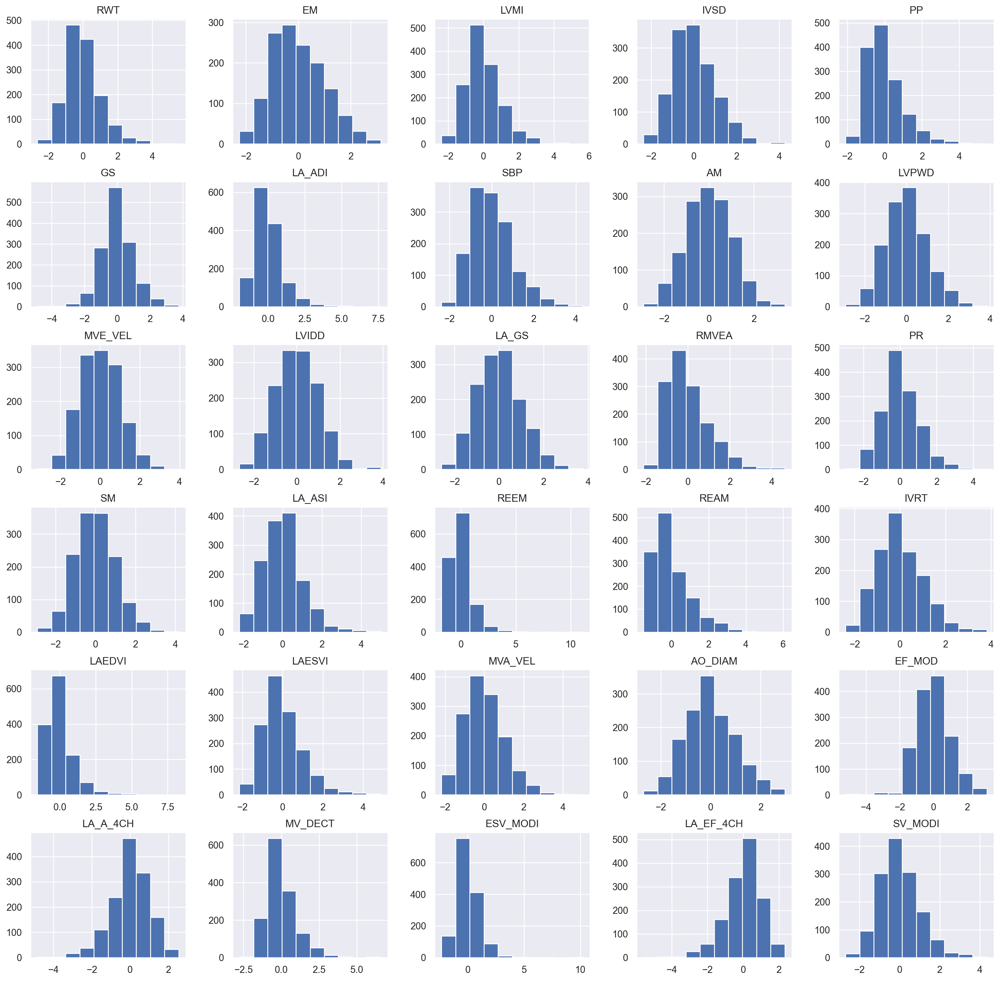

In [2]:
pyplot.figure(figsize=(20,20))
X_all.hist(ax=pyplot.gca())
pyplot.show()

##%%



## QQ plots

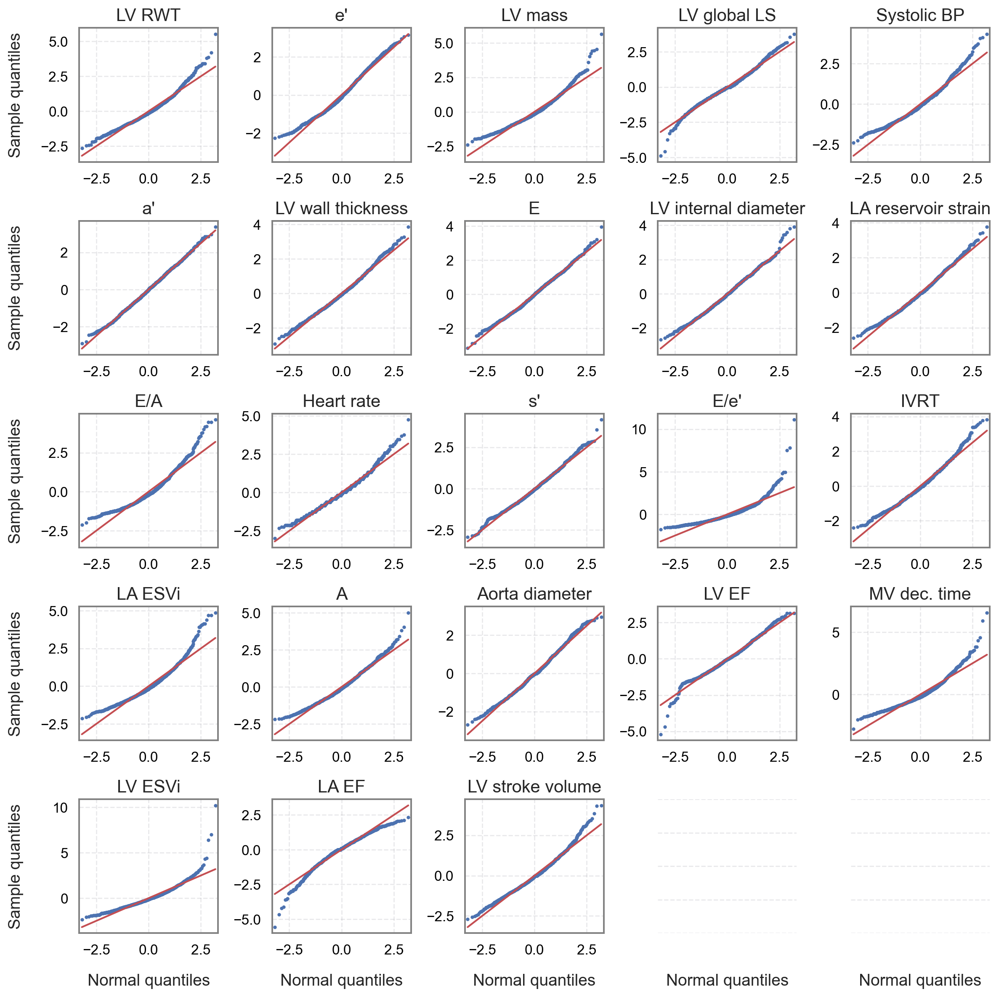

In [3]:
columns = 5
rows = math.ceil(len(X_correlated_removed.columns)/columns)
figure, axes = pyplot.subplots(rows, columns, figsize=(12,12))
axes_flat = list(flatten(axes))

def hide_except_axis(axis) -> None:
    axis.set_xticks([])
    pyplot.setp(axis.spines.values(), visible=False)
    axis.tick_params(left=False, labelleft=False)
    axis.patch.set_visible(False)

hide_except_axis(axes_flat[-1])
hide_except_axis(axes_flat[-2])

for index, (name, variable) in enumerate(X_correlated_removed.iteritems()):
    axis = axes_flat[index]
    plot_style(axis=axis)
    qqplot(variable, line='s', ax=axis, markersize=3, markeredgewidth=0)
    plot_style(axis=axis)
    axis.set_title(format_feature_short(name), fontsize=14)
    axis.xaxis.label.set_fontsize(12)
    axis.yaxis.label.set_fontsize(12)

for index, axis in enumerate(axes_flat):
    plot_style(axis=axis)
    if is_first_column(index, columns):
        axis.set_ylabel('Sample quantiles')
    else:
        axis.set_ylabel(None)

    if is_last_row(index, rows, columns):
        axis.set_xlabel('Normal quantiles')
    else:
        axis.set_xlabel(None)

    axis.yaxis.set_label_coords(-0.4, 0.5)
    axis.xaxis.set_label_coords(0.5, -0.3)

figure.tight_layout()
if EXPORT and not TEST:
    savefig(f'{plot_folder}/qq_plot.png', dpi=200)
    savefig(f'{plot_folder}/qq_plot.svg')
figure.show()

## Association between the variables

###  Pearson's r

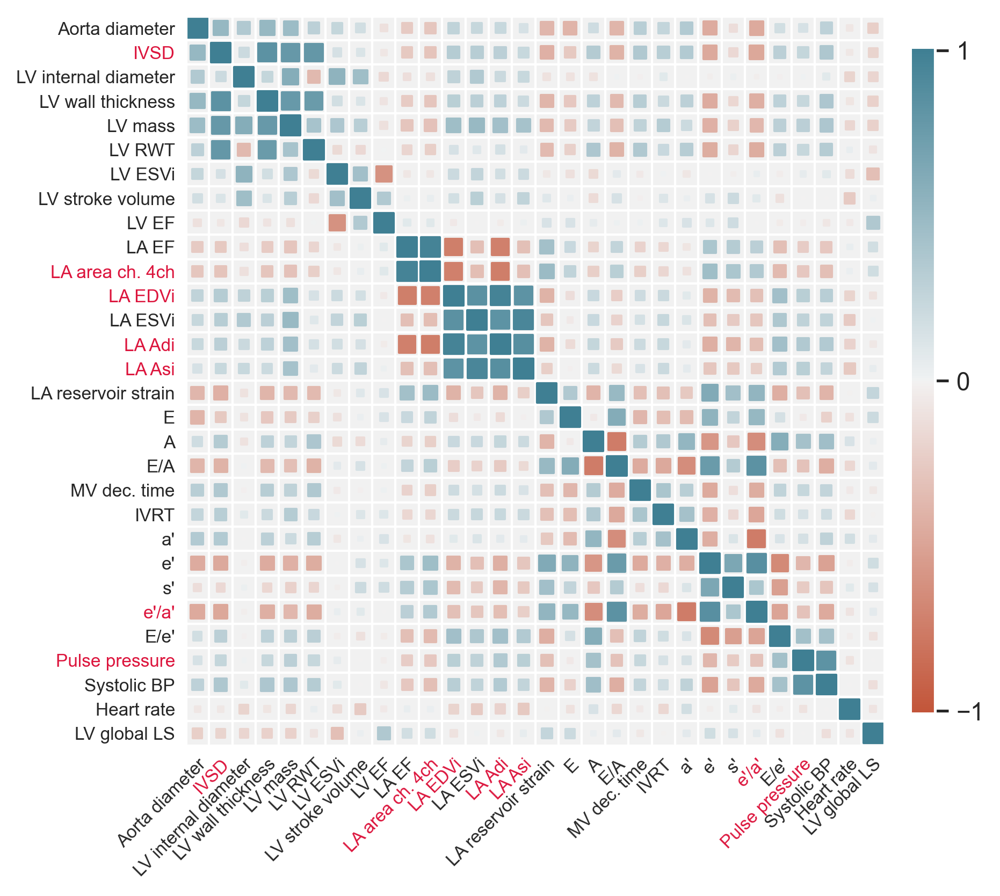

In [4]:
removed_features = set(X_all.columns)-set(X_correlated_removed.columns)

assert_equals(set(X_all.columns)-removed_features, set(X_correlated_removed.columns))

X_all_reordered = X_all.copy()
X_all_reordered = X_all_reordered[column_order_for_biclustering]

assert_equals(set(X_all_reordered.columns), set(X_all.columns))

X_all_reordered.columns = list(map(format_feature_short, X_all_reordered))

corr = X_all_reordered.corr()
pyplot.figure(figsize=(pyplot.rcParams['figure.figsize'][0], pyplot.rcParams['figure.figsize'][0]), dpi=300)
removed = mapl(format_feature_short, removed_features)
plot_correlation_heatmap(corr, size_scale=75, label_font=8, removed=removed)
# if not TEST:
    # pyplot.savefig('./data/clustering/plots/correlation_heatmap.png',  bbox_inches='tight', pad_inches=0, dpi=500)
pyplot.show();

### Association between the variables

In [5]:
from correlation_heatmap import plot_correlation_heatmap

from functools import partial
from typing import Callable, List

import seaborn
from matplotlib import pyplot
from minepy import MINE
from pandas import DataFrame, Series
from scipy.stats import pearsonr
from toolz import groupby

from formatting import format_feature_short, format_feature_medium_readable, \
    format_columns_df
from functional import pipe, decorate_unpack, statements, mapl
from data import get_datasets, data_all
from statistics_functions import compute_mic, compute_r
from utils import compute_matrix_from_columns
from visualisation import list_of_lists_to_html_table, display_html



def get_correlated_raw(
        threshold: float,
        data: DataFrame,
        correlation_metric: Callable[[Series, Series], float],
        remove_na: bool = True,
):
    for index1, (columns_1_name, columns_1_series) in enumerate(data.items()):
        for index2, (columns_2_name, columns_2_series) in enumerate(data.items()):
            if index1 < index2:

                if remove_na:
                    mask = ~columns_1_series.isna() & ~columns_2_series.isna()
                else:
                    mask = [True] * len(columns_1_series)

                correlation_value = correlation_metric(columns_1_series[mask], columns_2_series[mask])
                if abs(correlation_value) >= threshold:
                    yield {
                        'var1': columns_1_name,
                        'var2': columns_2_name,
                        'value': correlation_value
                    }

def display_correlated_table(
        threshold: float,
        data: DataFrame,
        correlation_metric: Callable[[Series, Series], float] = compute_r,
) -> None:
    return pipe(
        get_correlated_raw(threshold, data, correlation_metric),
        partial(sorted, key=lambda item: abs(item['value']), reverse=True),
        list,
        partial(groupby, lambda item: item['var1']),
        dict.items,
        partial(map, decorate_unpack(
            lambda var1, other_items: [var1, ", ".join([other_item['var2']+f' ({other_item["value"]:.2f})' for other_item in other_items])]
        )),
        list,
    )

column_order = [
    # M-mode measurements
    'AO_DIAM',
    'IVSD',
    'LVIDD',
    'LVPWD',
    'LVMI',
    'RWT',
    # 2D measurements
    'ESV_MODI',
    'SV_MODI',
    'EF_MOD',
    'LA_EF_4CH',
    'LA_A_4CH',
    'LAEDVI',
    'LAESVI',
    'LA_ADI',
    'LA_ASI',
    'LA_GS',
    # Classical Doppler measurements
    'MVE_VEL',
    'MVA_VEL',
    'RMVEA',
    'MV_DECT',
    'IVRT',
    # Tissue Doppler measurements
    'AM',
    'EM',
    'SM',
    'REAM',
    'REEM',
    # Blood pressure
    'PP',
    'SBP',
    'PR',
    # 2D strain measurements
    'GS'
]


def plot_correlation_matrix(matrix: DataFrame) -> None:
    removed_features = set(datasets_all['base'].columns)-set(datasets_all['clustering_correlated_removed'].columns)
    removed = mapl(format_feature_medium_readable, removed_features)
    seaborn.set()
    fig = pyplot.figure(figsize=(pyplot.rcParams['figure.figsize'][0], pyplot.rcParams['figure.figsize'][0]), dpi=200)
    matrix_ = matrix.copy()
    matrix_.columns = list(map(format_feature_medium_readable, matrix_))
    matrix_.index = list(map(format_feature_medium_readable, matrix_.index))
    plot_correlation_heatmap(matrix_, size_scale=75, label_font=6, removed=removed, color_range=[0, 1], palette=seaborn.color_palette("rocket_r", n_colors=500))
    pyplot.tight_layout()


def reorder_features(data_frame: DataFrame, features_: List[str]) -> DataFrame:
    data_frame_new = data_frame.copy()
    data_frame_new = data_frame_new[features_]
    return data_frame_new


#### Pearson's r correlation matrix

/tmp/ipykernel_369144/1412254650.py:112: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



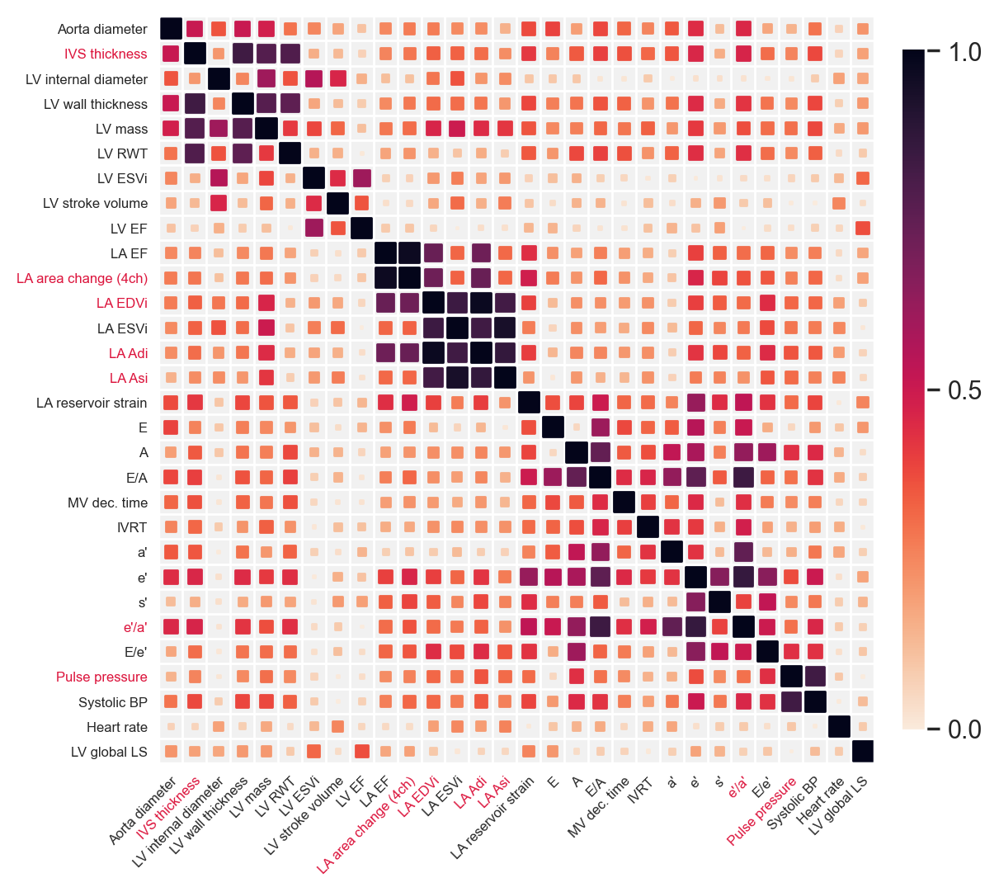

In [6]:
r_matrix  = compute_matrix_from_columns(datasets_all['clustering'], callback=lambda s1, s2: abs(pearsonr(s1, s2)[0]))
r_matrix = reorder_features(r_matrix, column_order)

plot_correlation_matrix(r_matrix)

#### Variables with Person's r > 0.5

In [7]:

pipe(
    datasets_all['clustering'],
    partial(format_columns_df, callback=format_feature_short),
    partial(display_correlated_table, 0.8),
    list_of_lists_to_html_table,
    display_html,
)


LA Adi,"LA EDVi (0.97), LA Asi (0.87), LA ESVi (0.83)"
LA area ch. 4ch,LA EF (0.97)
LA Asi,"LA ESVi (0.94), LA EDVi (0.83)"
e',e'/a' (0.86)
LA EDVi,LA ESVi (0.84)
E/A,e'/a' (0.84)
IVSD,LV wall thickness (0.84)
Pulse pressure,Systolic BP (0.83)


#### MIC association matrix

/tmp/ipykernel_369144/1412254650.py:112: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



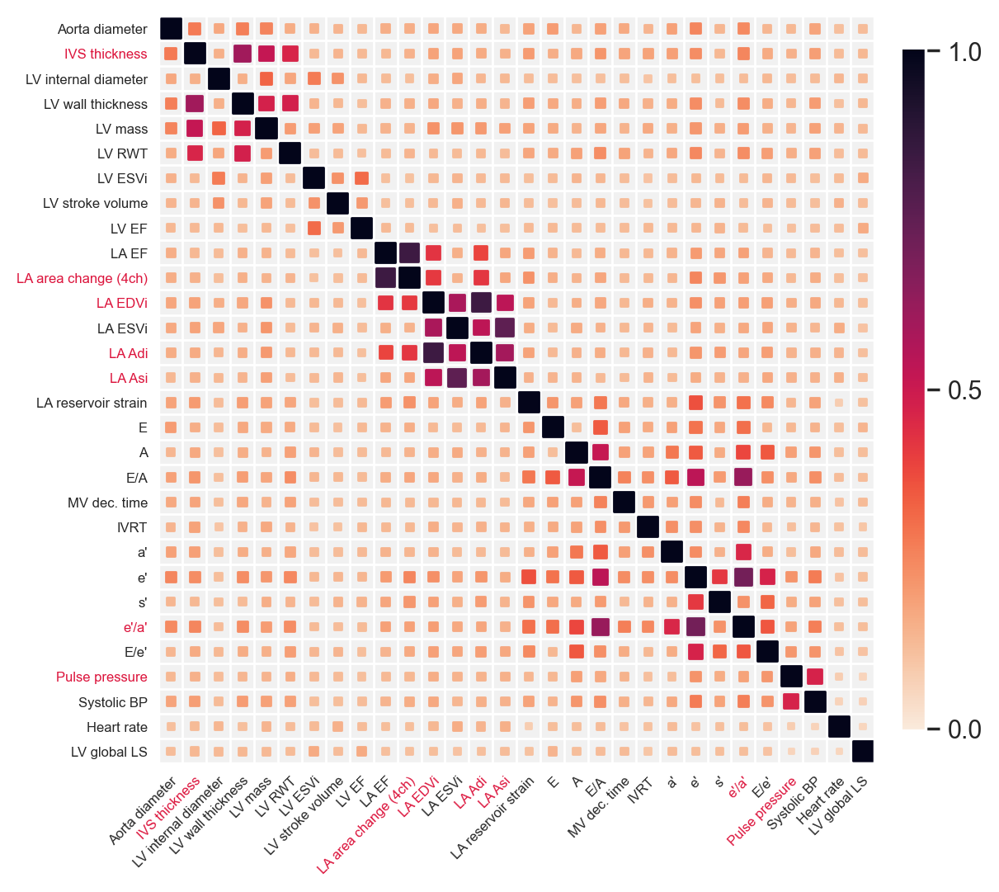

In [8]:
mic_matrix  = compute_matrix_from_columns(datasets_all['clustering'], callback=compute_mic)
mic_matrix = reorder_features(mic_matrix, column_order)

plot_correlation_matrix(mic_matrix)

#### Variables with MIC > 0.5

In [9]:
pipe(
    datasets_all['clustering'],
    partial(format_columns_df, callback=format_feature_short),
    partial(display_correlated_table, 0.5, correlation_metric=lambda s1, s2: statements(
        m := MINE(),
        m.compute_score(s1, s2),
        m.mic(),
    )),
    list_of_lists_to_html_table,
    display_html,
)

LA area ch. 4ch,LA EF (0.84)
LA Adi,"LA EDVi (0.84), LA Asi (0.59), LA ESVi (0.53)"
LA Asi,"LA ESVi (0.76), LA EDVi (0.54)"
e',"e'/a' (0.71), E/A (0.54)"
E/A,"e'/a' (0.62), A (0.52)"
IVSD,LV wall thickness (0.60)
LA EDVi,LA ESVi (0.58)
LV mass,IVSD (0.52)


#### Scatter plots for R > 0.8

In [10]:
datasets_raw = get_datasets(data_all, impute=False)

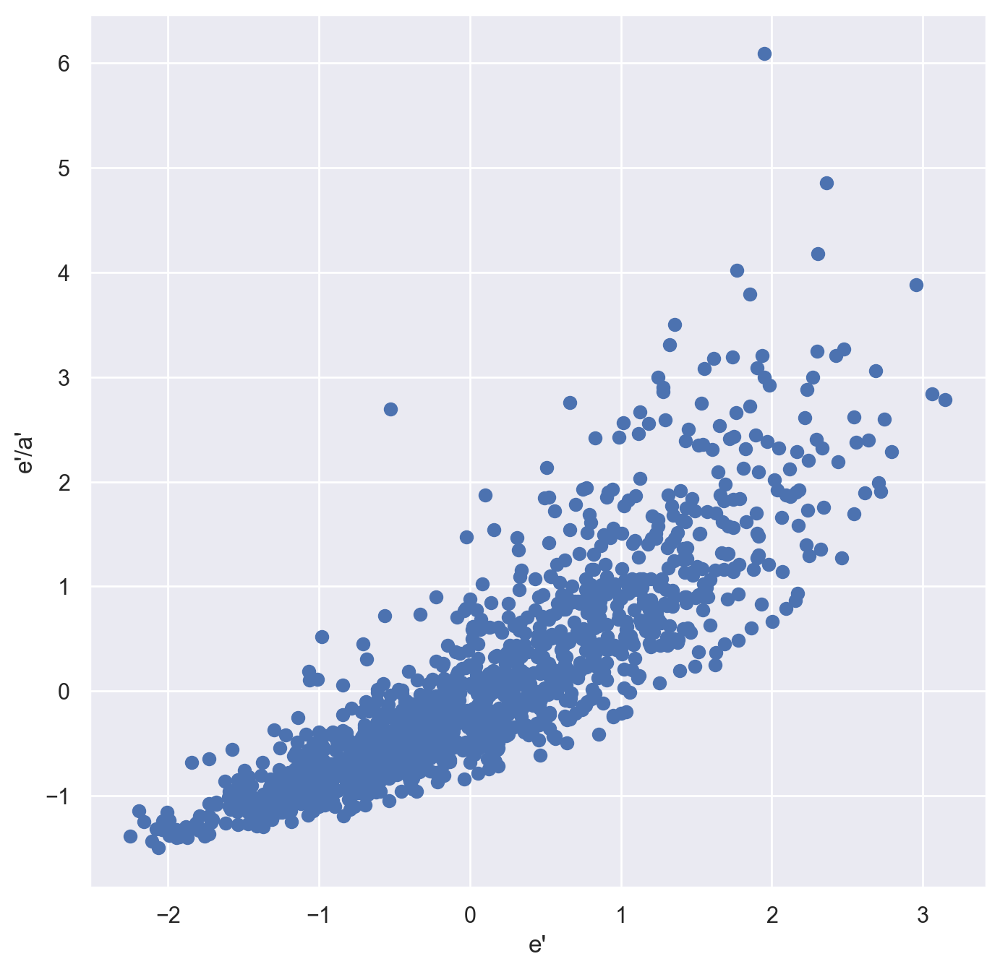

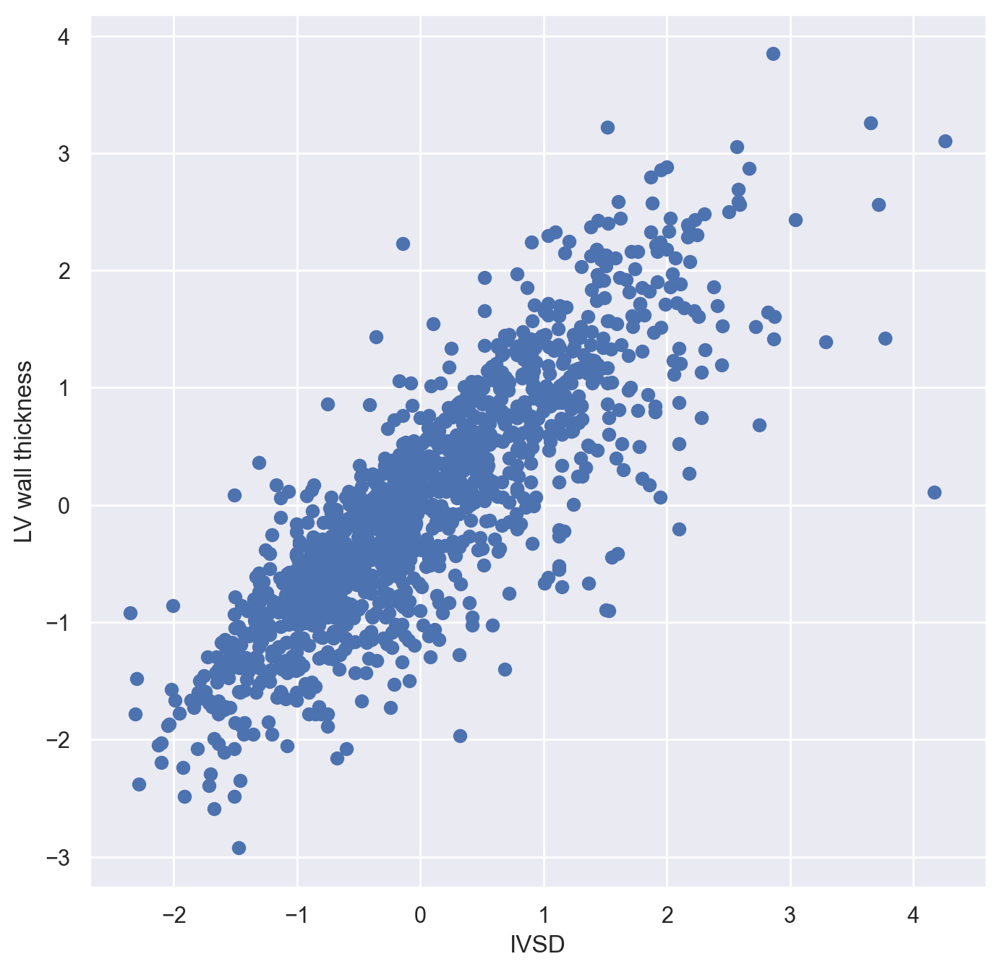

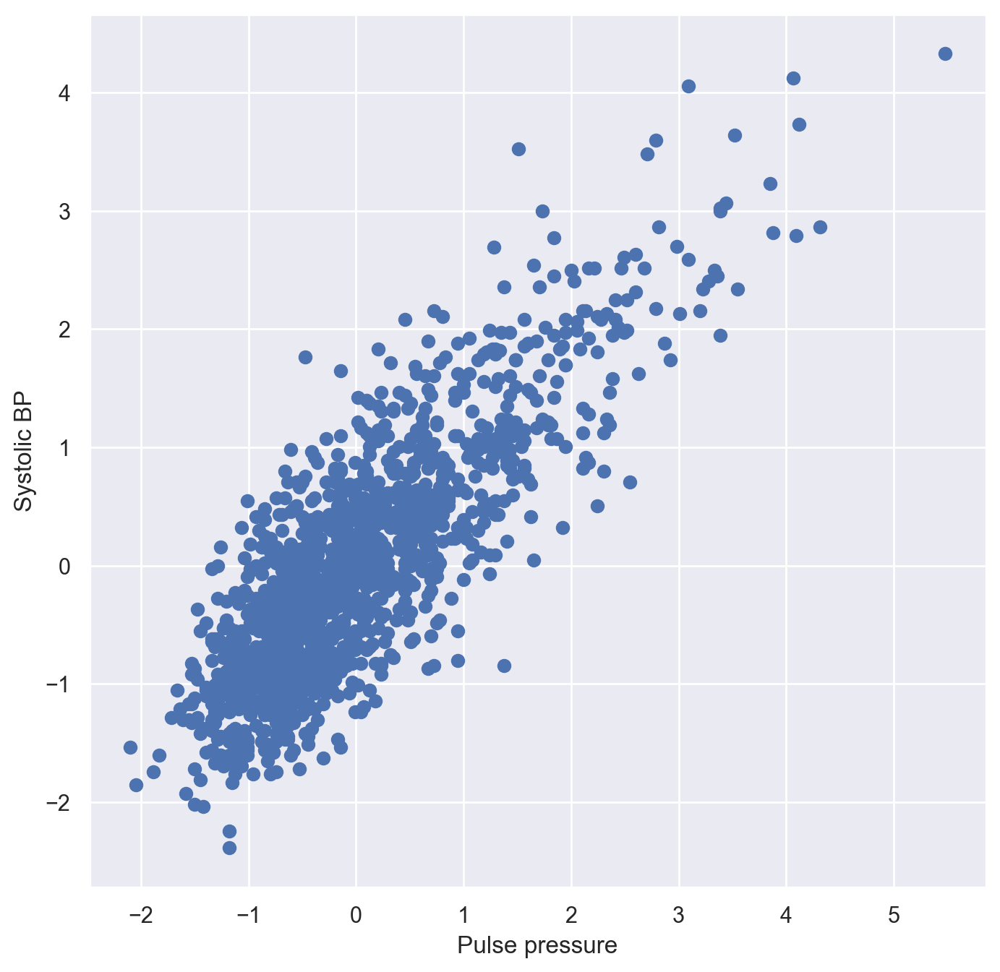

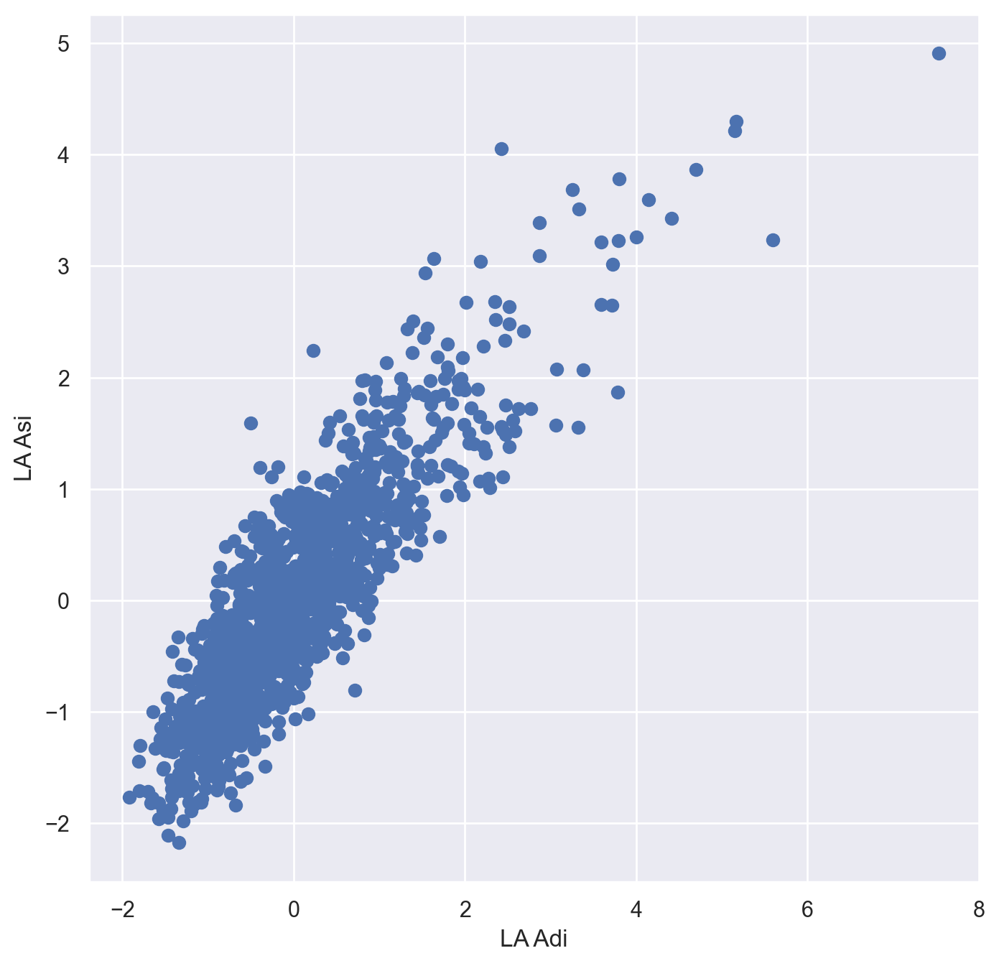

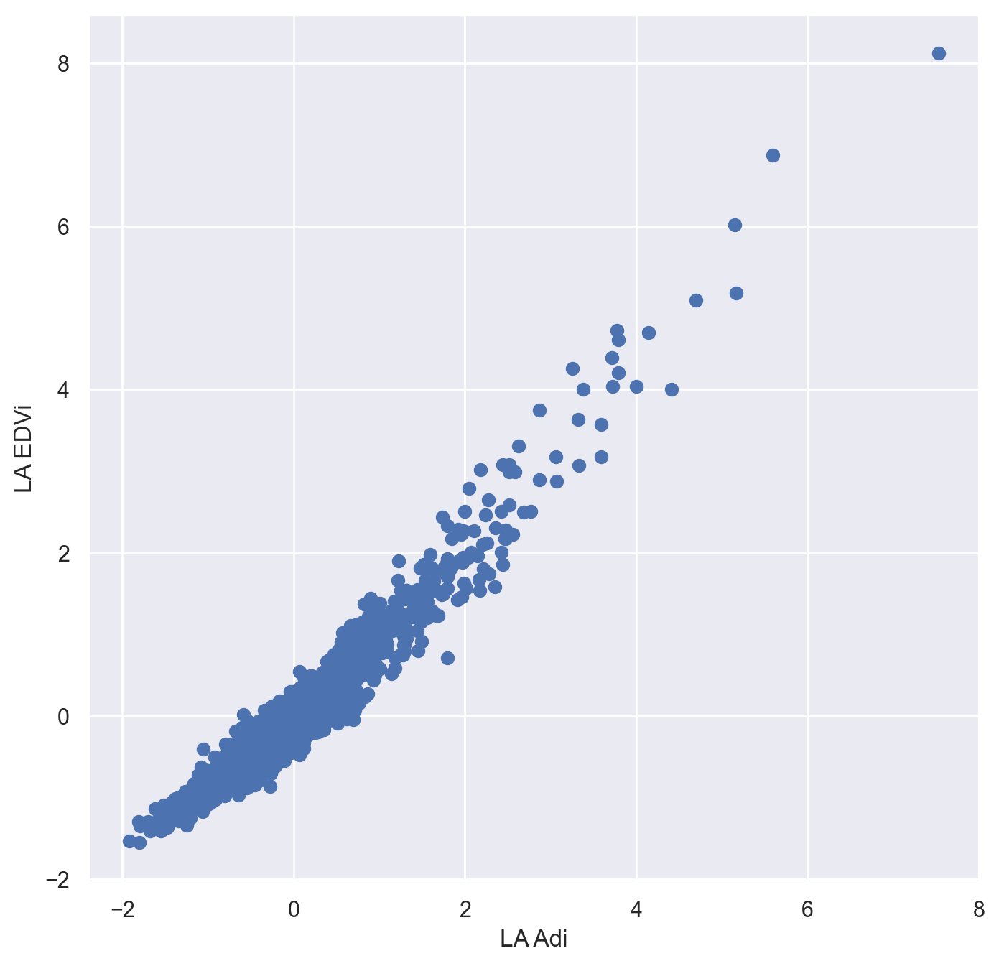

...

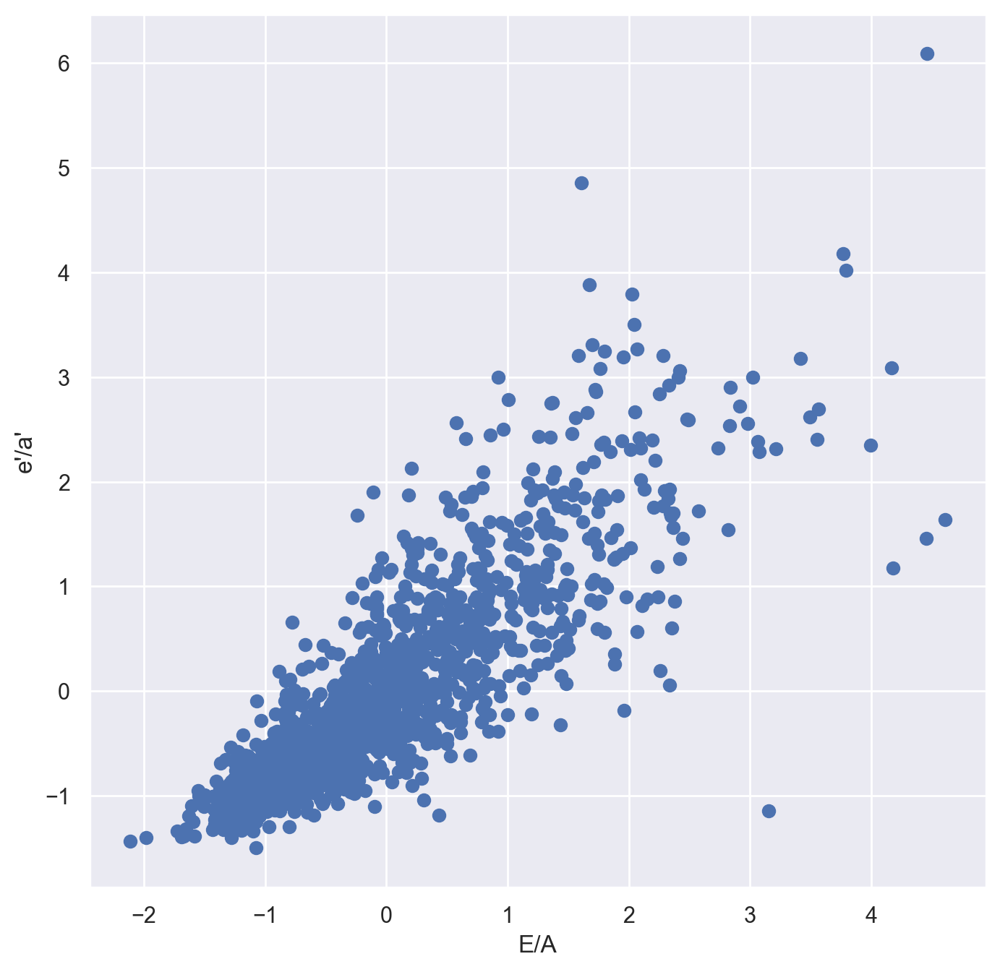

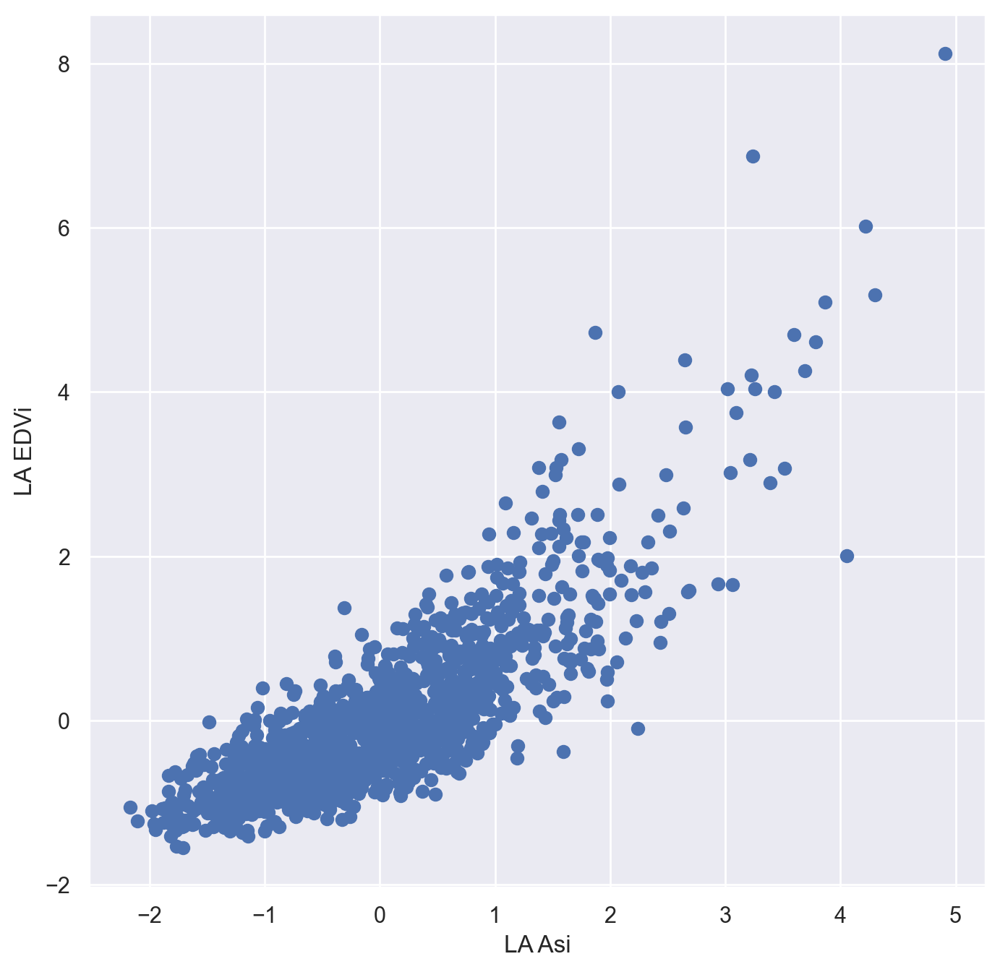

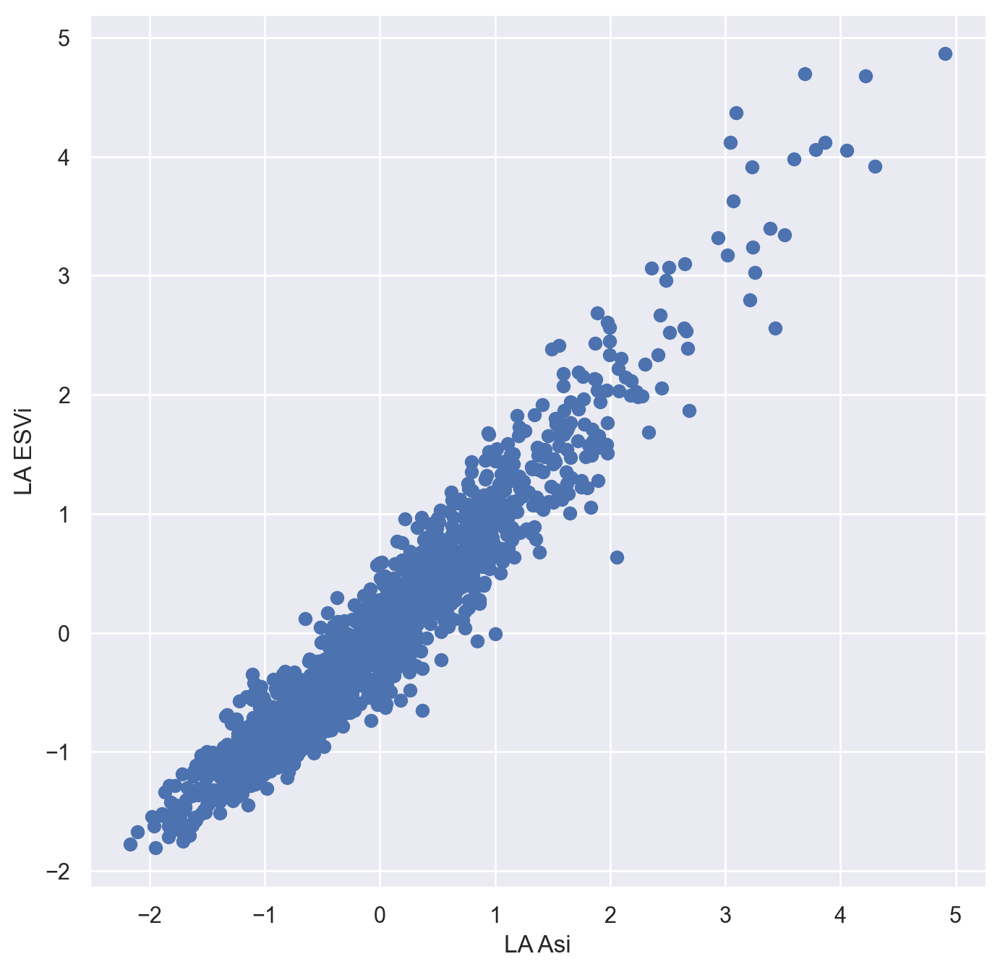

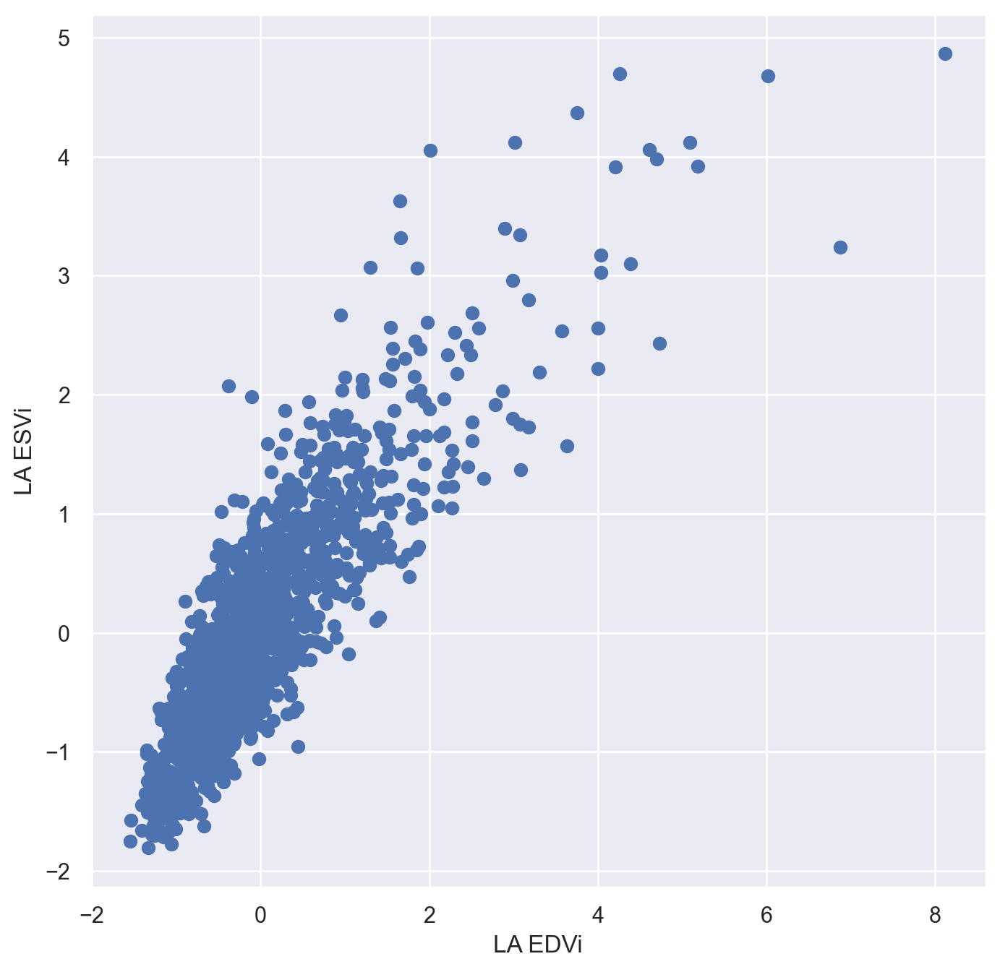

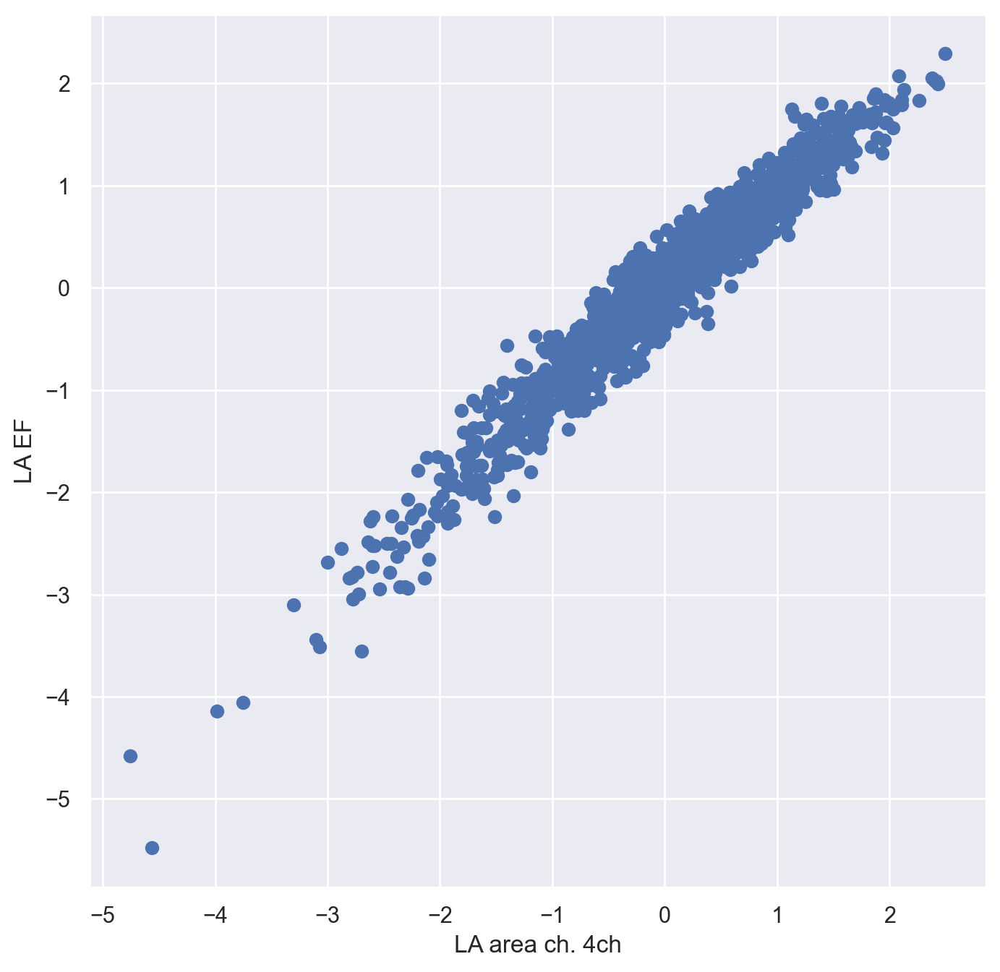

In [11]:
r_correlated_raw = list(get_correlated_raw(0.8, datasets_raw['clustering'], correlation_metric=compute_r))

for item in r_correlated_raw:
    pyplot.figure(figsize=(8, 8))
    pyplot.scatter(datasets_raw['clustering'][item['var1']], datasets_raw['clustering'][item['var2']])
    pyplot.xlabel(format_feature_short(item['var1']))
    pyplot.ylabel(format_feature_short(item['var2']))

#### Scatter plots for MIC > 0.5

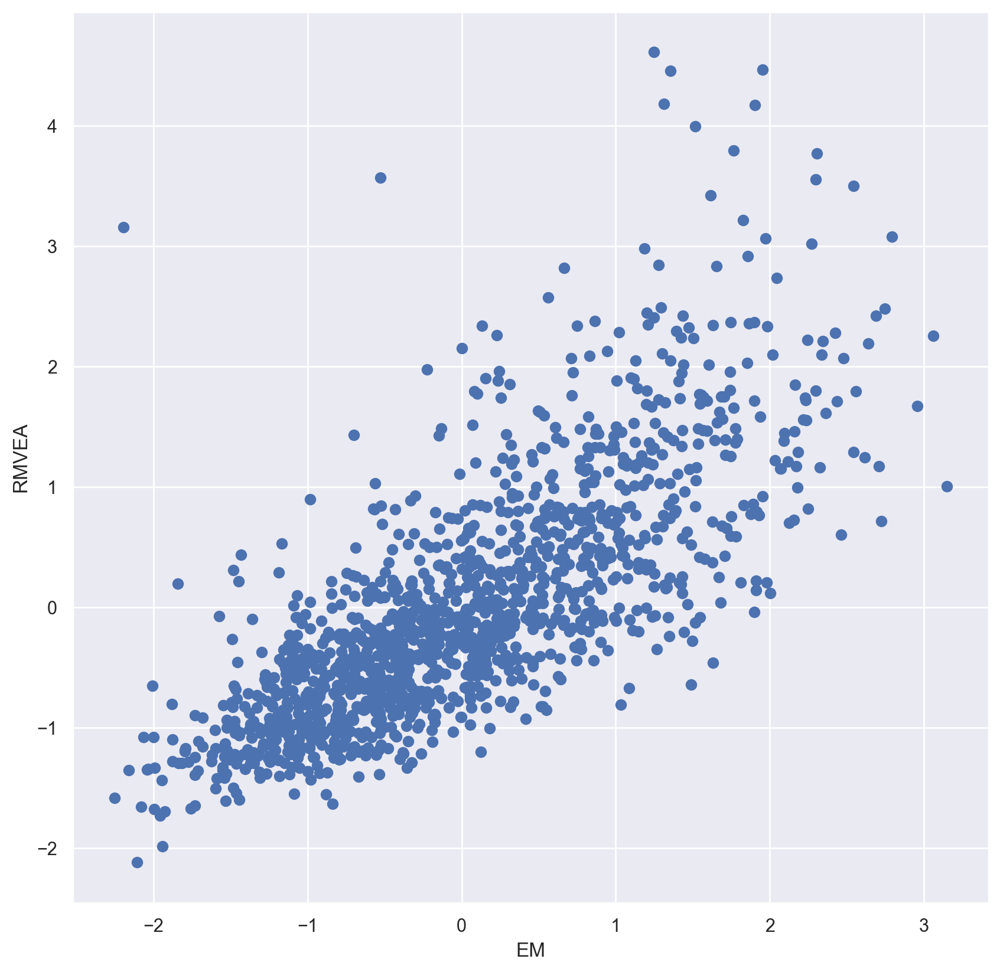

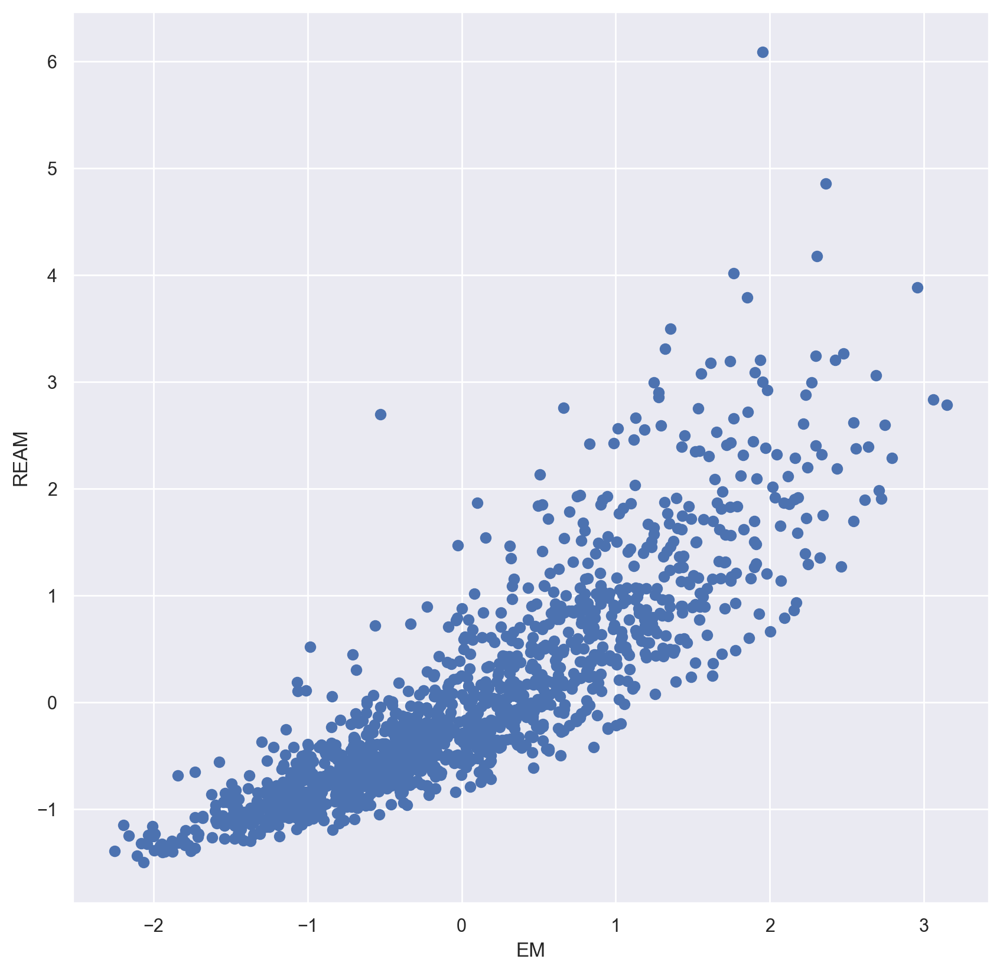

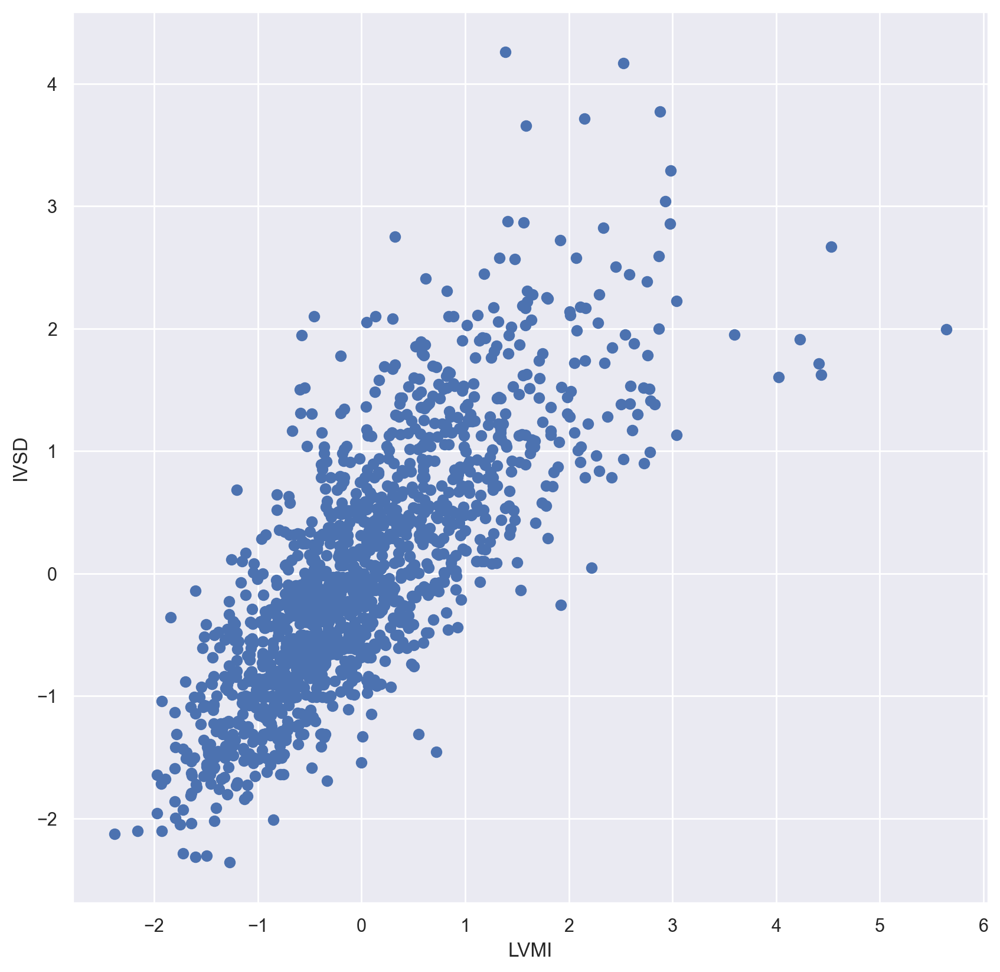

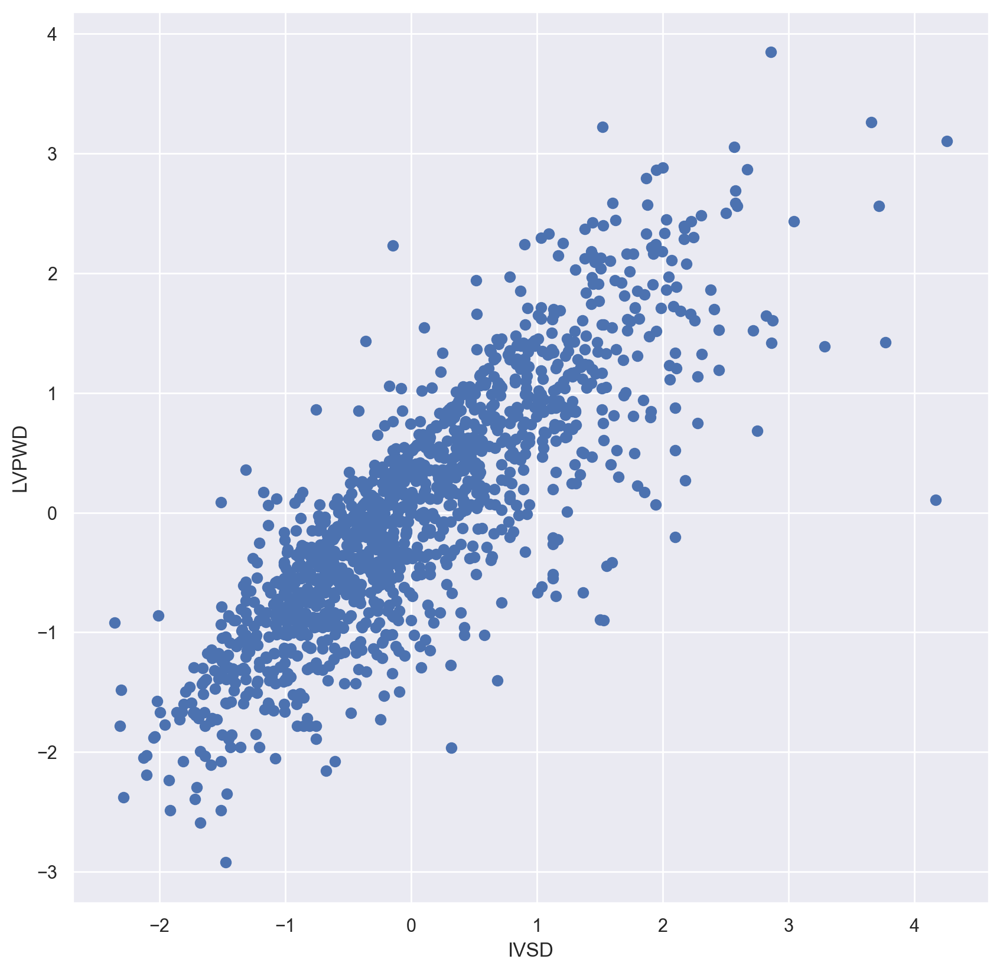

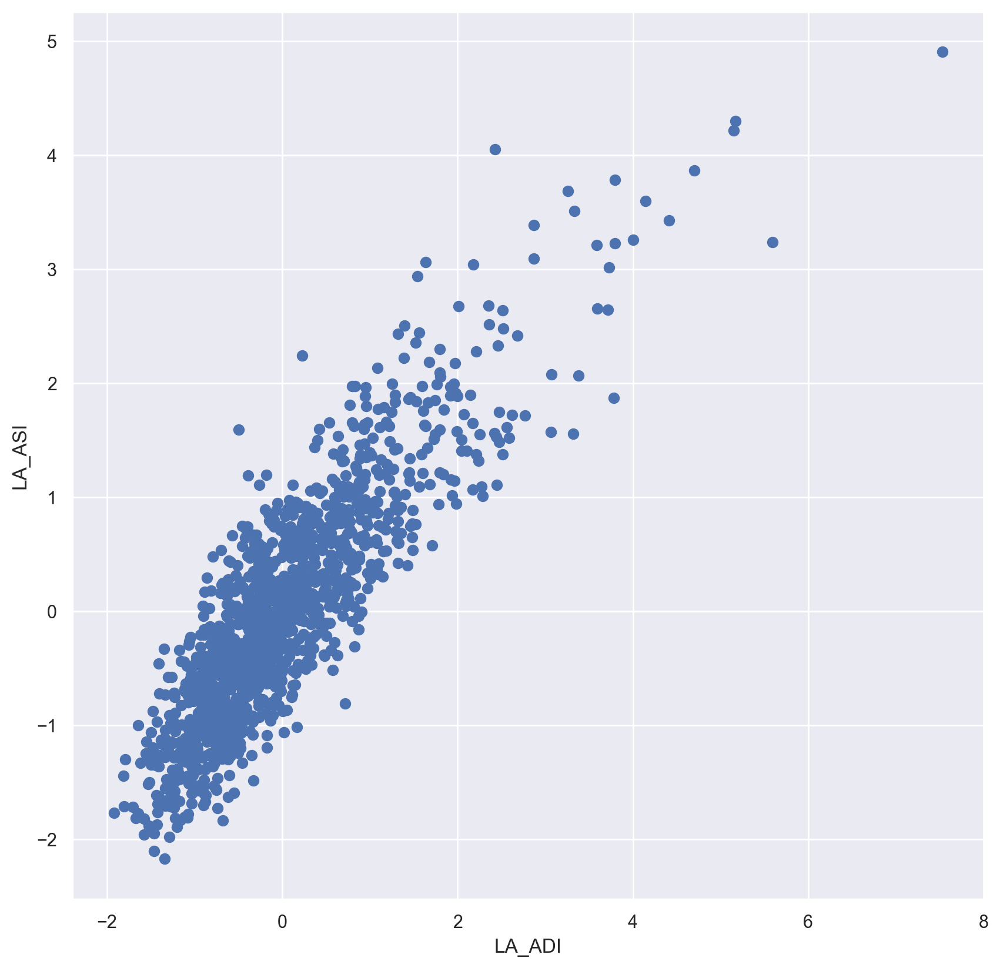

...

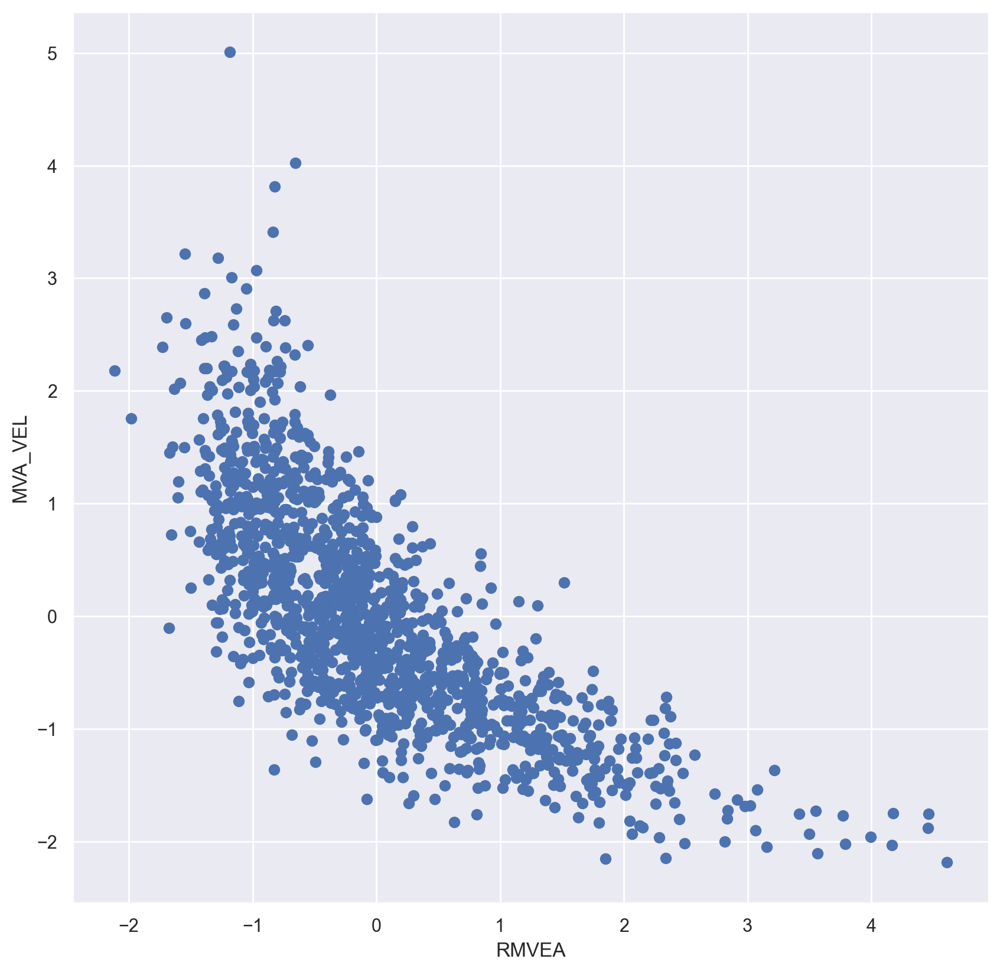

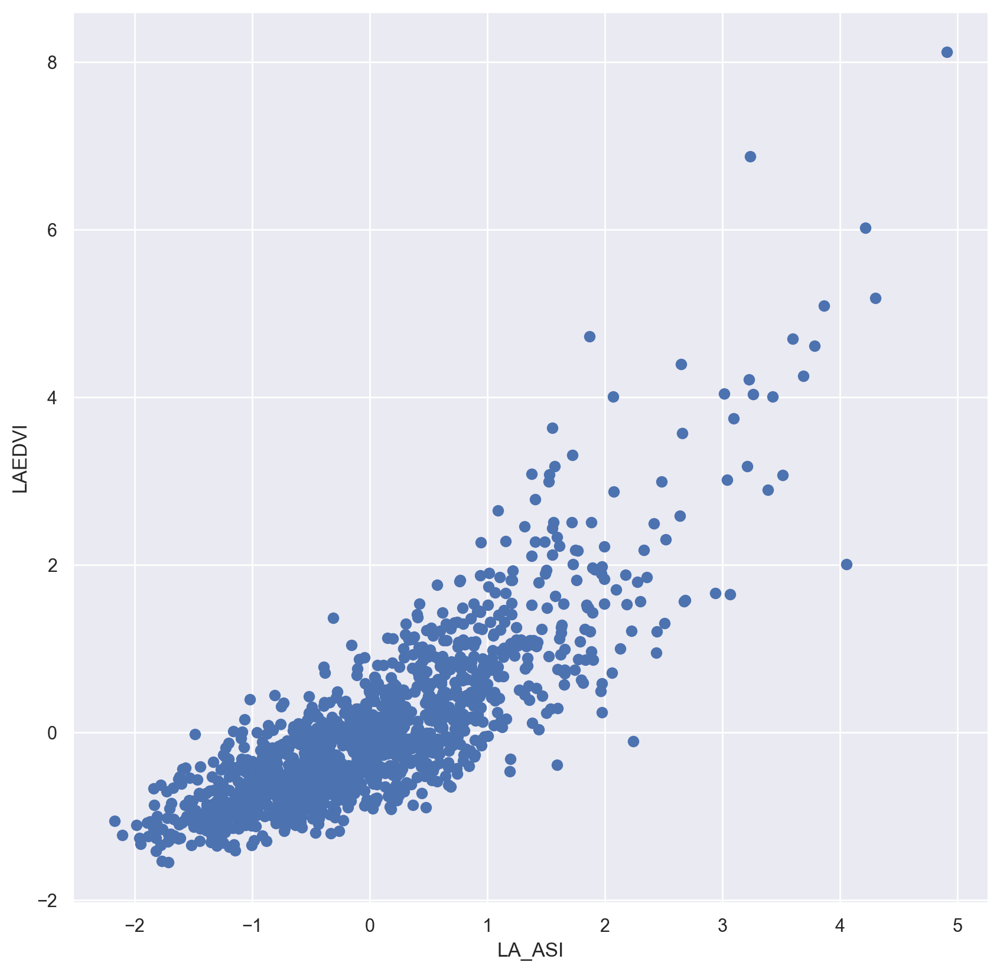

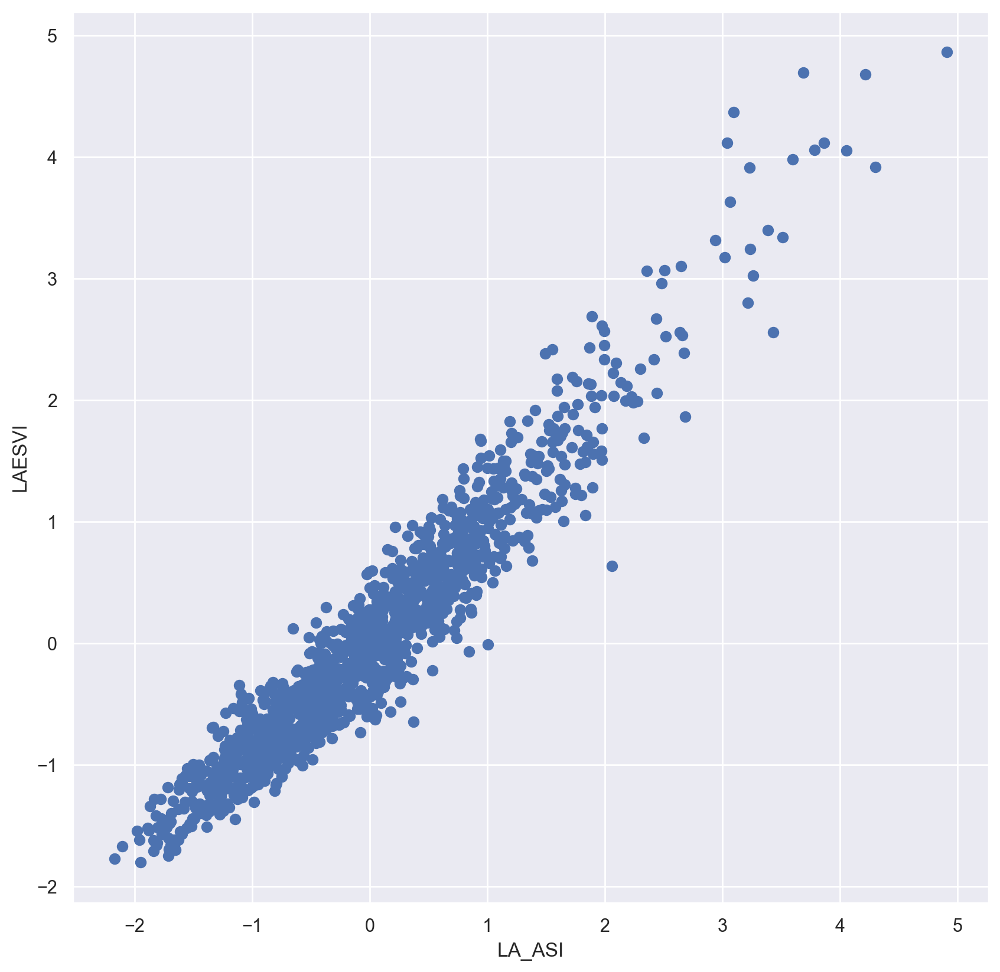

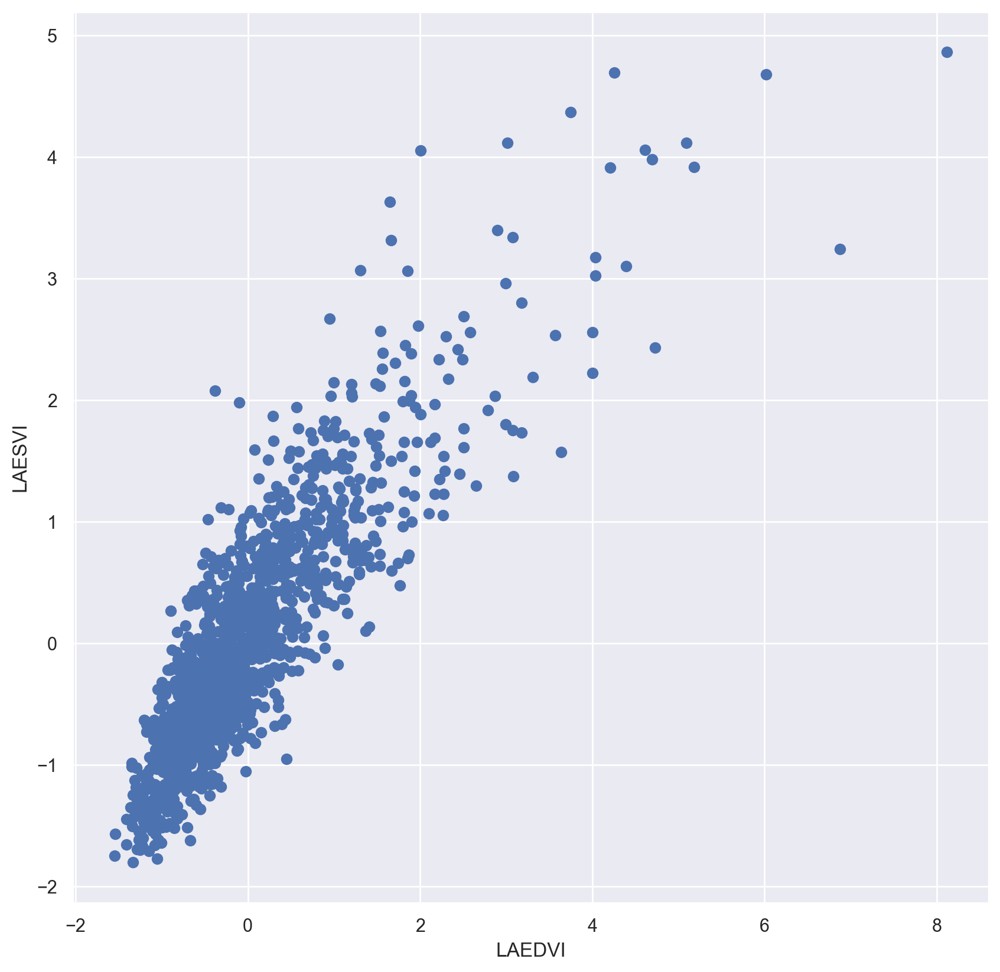

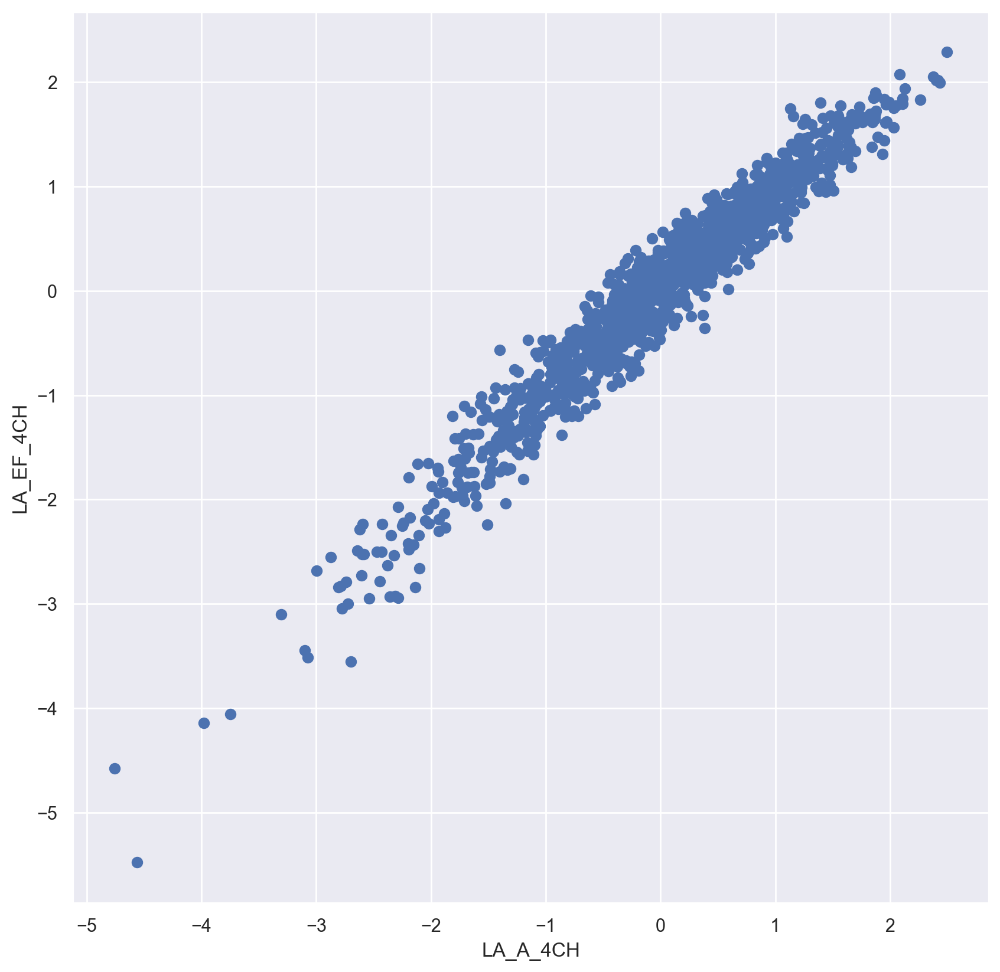

In [12]:
mic_correlated_raw = list(get_correlated_raw(0.5, datasets_raw['clustering'], correlation_metric=compute_mic))

for item in mic_correlated_raw:
    pyplot.figure(figsize=(10, 10))
    pyplot.scatter(datasets_raw['clustering'][item['var1']], datasets_raw['clustering'][item['var2']])
    pyplot.xlabel(item['var1'])
    pyplot.ylabel(item['var2'])

## Biclustering

/home/nicholas/.local/share/virtualenvs/echo-clustering-1qRNcF5J/lib/python3.8/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



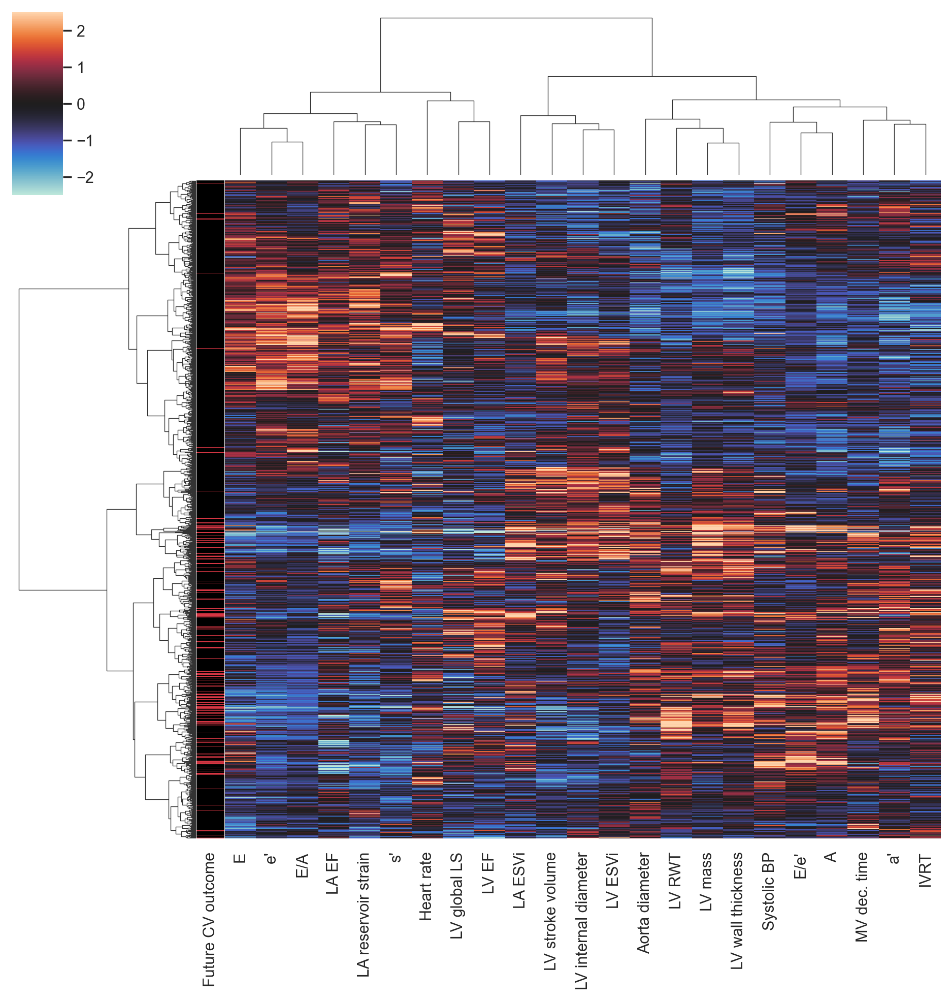

In [13]:
if TEST:
    index = list(range(90))
    X = list()
    X[:30] = [[10, 5, 5, 5, 5]]*30
    X[30:60] = [[5, 10, 5, 5, 5]]*30
    X[61:90] = [[5, 10, 5, 5, -5]]*30
    X = DataFrame(X, index=index)

    X_blobs, y_blobs = make_blobs(n_features=10, centers=2, random_state=14)
    X_blobs = DataFrame(X_blobs)
    y_true = X_blobs[0] > X_blobs[0].mean()
    X_biclustering = X_blobs

X_biclustering_mapped = X_biclustering.copy()
X_biclustering_mapped.columns = map(format_feature_short, X_biclustering_mapped.columns)
graph = seaborn.clustermap(
    X_biclustering_mapped.reset_index(drop=True),
    z_score=1,
    robust=True,
    method='ward',
    center=0,
    vmin=-2.5,
    vmax=2.5,
    row_colors=DataFrame(
        {
            'Future CV outcome': ['#d63643' if label_for_row == 1 else 'black' for label_for_row in y_true]
        }
    ),
)
graph.ax_heatmap.set_yticks([])
if not TEST:
    savefig(f'{plot_folder}/biclustering.png', dpi=500)
pyplot.show()

## Selection of cluster number

In [14]:

np.random.seed(59)


features_for_k = [
    [],
    [
        'PR', 'SV_MODI', 'RWT', 'EM', 'LVMI', 'GS', 'SBP', 'AM', 'LVPWD', 'MVE_VEL', 'LVIDD',
        'LA_GS', 'RMVEA', 'SM', 'REEM', 'IVRT', 'LAESVI', 'MVA_VEL', 'AO_DIAM', 'EF_MOD', 'MV_DECT',
        'ESV_MODI', 'LA_EF_4CH'
    ],
    [
        'RWT', 'EM', 'LVMI', 'GS', 'SBP', 'AM', 'LVPWD', 'MVE_VEL', 'LVIDD', 'LA_GS', 'RMVEA', 'SM',
        'REEM', 'IVRT', 'LAESVI', 'MVA_VEL', 'AO_DIAM', 'EF_MOD', 'MV_DECT', 'ESV_MODI', 'LA_EF_4CH'
    ],
    [
        'RWT', 'EM', 'LVMI', 'GS', 'SBP', 'AM', 'LVPWD', 'MVE_VEL', 'LVIDD', 'LA_GS', 'RMVEA', 'SM',
        'REEM', 'IVRT', 'LAESVI', 'MVA_VEL', 'AO_DIAM', 'EF_MOD', 'MV_DECT', 'ESV_MODI',
        'LA_EF_4CH', 'SV_MODI'
    ],
    *[
        [
            'RWT', 'EM', 'LVMI', 'GS', 'SBP', 'AM', 'LVPWD', 'MVE_VEL', 'LVIDD', 'LA_GS', 'RMVEA',
            'PR', 'SM', 'REEM', 'IVRT', 'LAESVI', 'MVA_VEL', 'AO_DIAM', 'EF_MOD', 'MV_DECT',
            'ESV_MODI', 'LA_EF_4CH', 'SV_MODI'
        ]
    ] * 4,
]


k_selection_protocol = GaussianMixtureProtocol(parameters={'clustering__n_init': 50})
bics_for_k = []
bics_for_k_range = range(8)

for k in bics_for_k_range:
    features = features_for_k[k]
    if not len(features) == 0:
        X_for_k = X_all[features]
        model = k_selection_protocol.get_pipeline(k)
        model.fit(X_for_k)
        bic_for_k = model[-1].bic(X_for_k.to_numpy())
        bics_for_k.append(bic_for_k)
    else:
        bics_for_k.append(None)
    print('.', end='')
print()



........


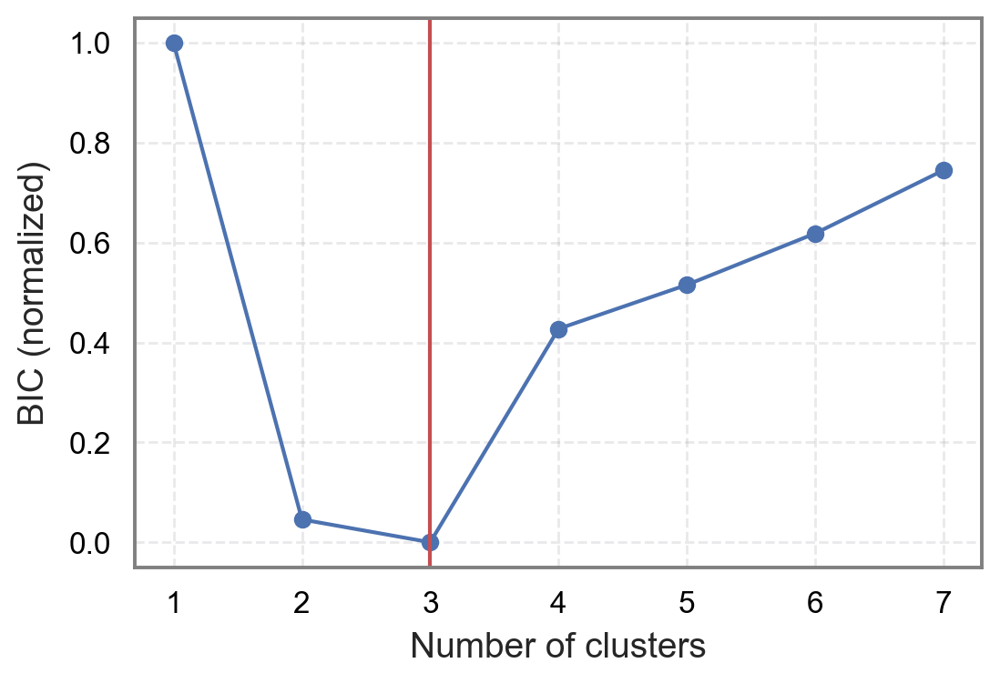

In [15]:
x_bics_for_k = list(range(len(bics_for_k)))
y_bics_for_k = MinMaxScaler().fit_transform(DataFrame(bics_for_k))

pyplot.plot(x_bics_for_k, y_bics_for_k, zorder=2)
plot_style()
pyplot.scatter(x_bics_for_k, y_bics_for_k, zorder=2)
pyplot.xlabel('Number of clusters')
pyplot.ylabel('BIC (normalized)')
pyplot.axvline(x=pipe(
    y_bics_for_k,
    partial(filter, lambda item: not np.isnan(item)),
    min,
    lambda min_value: find_index(lambda value: min_value == value, y_bics_for_k)
), linewidth=1.5, color='r')

## Discriminative power of variables from VarSelLCM

In [16]:
%%R -i X_correlated_removed

library(VarSelLCM)
discriminative_result <- VarSelCluster(X_correlated_removed, 3, crit.varsel='BIC', nbcores = 12, initModel=50)


rpy2.rinterface_lib.callbacks:WARNING: R[write to console]: 
Attaching package: ‘VarSelLCM’


rpy2.rinterface_lib.callbacks:WARNING: R[write to console]: The following object is masked from ‘package:stats’:

    predict




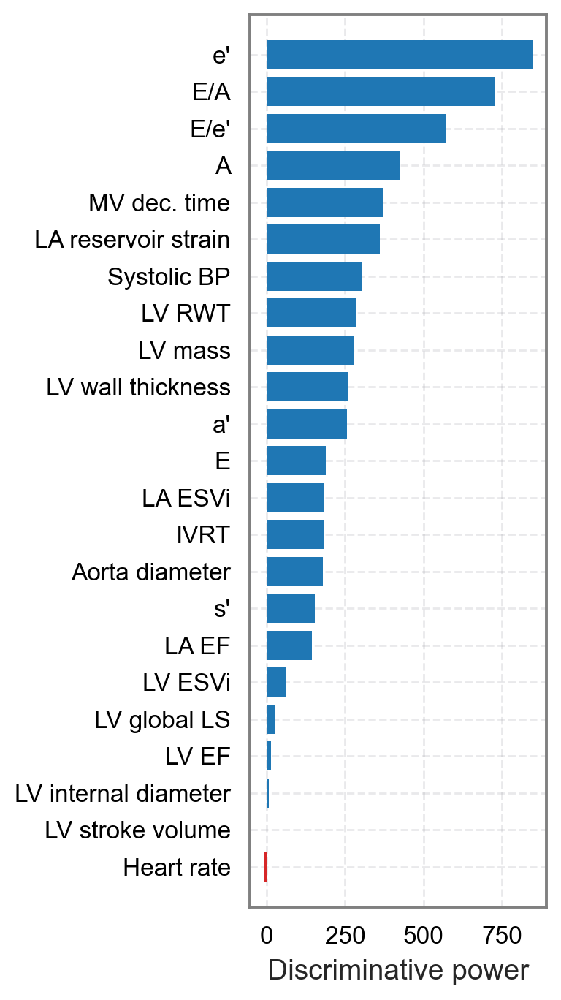

In [17]:
importance = %R discriminative_result@criteria@discrim
features = %R names(discriminative_result@criteria@discrim)
importance = importance[::-1]
features = features[::-1]

pyplot.figure(figsize=(4, 7))
plot_style()
pyplot.barh(mapl(format_feature_short, features), importance, color=['#1f77b4' if value > 0 else '#d62728' for value in importance], linewidth=0)
pyplot.xlabel('Discriminative power')
pyplot.margins(0.05, 0.03)
pyplot.tight_layout()
if not TEST:
    pyplot.savefig(f'{plot_folder}/feature_importance.{EXPORT_FORMAT}', dpi=500)
pyplot.show()

## Assignments

In [18]:
from functional import assign_index

def get_clustering_paritition(protocol, n_clusters):
    pipeline = protocol.get_pipeline(n_clusters)

    assert_equals(len(X.columns), 22)

    y_pred = Series(pipeline.fit_predict(X), index=X.index)
    y_pred = map_y_pred_by_prevalence(y_pred, y_true)
    try:
        pipeline.predict_proba
    except AttributeError:
        y_proba = pipe(
            y_pred,
            partial(map, lambda current_cluster: statements(
                    new_row := [0]*n_clusters,
                    assign_index(new_row, current_cluster, 1),
                ),
            ),
            list,
            np.array,
            np.transpose,
            lambda lists: {
                column: values for column, values in enumerate(lists)
            },
            partial(DataFrame, index=y_pred.index),
        )
    else:
        y_proba = DataFrame(pipeline.predict_proba(X), index=X.index)

    y_proba = sort_y_proba_by_prevalence(y_proba, y_true)


    return {
        'y_proba': y_proba,
        'y_pred': y_pred,
    }

def plot_assignments(y_proba, y_pred, y_true):
    y_proba_with_label = y_proba.copy().assign(
        y_pred=y_pred, y_true=y_true, cpnbrx=BASE_DATASET['base']['CPNBRX']
    )
    y_proba_with_label = y_proba_with_label.sort_values(by=['y_true', 'y_pred'])
    seaborn.set_style({'font.family': 'Arial'})
    pyplot.figure(dpi=200)
    cluster_counts = y_pred.value_counts()

    seaborn.heatmap(
        y_proba_with_label[[0, 1, 2, 'y_true']],
        cmap='Blues',
        xticklabels=[
            f'Cluster #1\n({cluster_counts[0]})',
            f'Cluster #2\n({cluster_counts[1]})',
            f'Cluster #3\n({cluster_counts[2]})',
            f'Outcome\n({y_true.value_counts()[1]})']
    )
    pyplot.gca().axes.get_yaxis().set_ticks([])
    pyplot.ylabel('Individuals')

In [19]:
partition_results = dict(
    gaussian = get_clustering_paritition(GaussianMixtureProtocol, N_CLUSTERS),
)

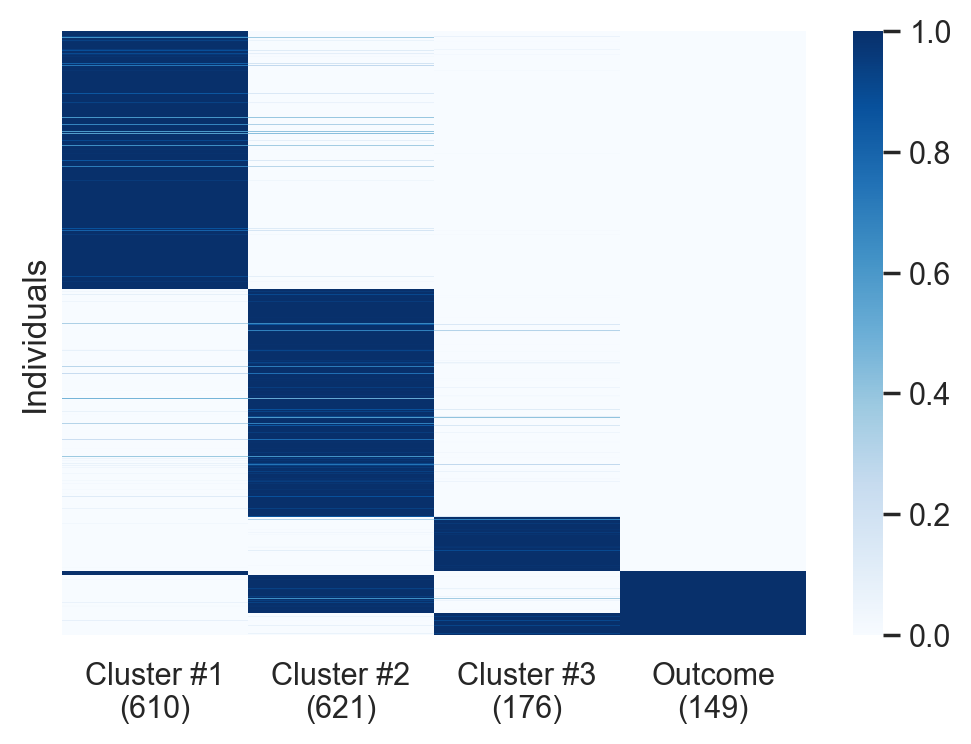

In [20]:
plot_assignments(partition_results['gaussian']['y_proba'], partition_results['gaussian']['y_pred'], y_true)


## Outcome per cluster

In [21]:

for name, results in partition_results.items():
    prevalence_by_cluster = [['Cluster #', 'No outcome', 'Outcome', ' Total']]
    for cluster_index in range(3):
        prevalence_by_cluster_row = [cluster_index+1]
        counts_per_cluster = y_true[results['y_pred']==cluster_index].value_counts()
        cluster_sum = counts_per_cluster.sum()
        for y_pred_value, y_pred_value_count in counts_per_cluster.items():
            percentage = format_percents(y_pred_value_count/cluster_sum)
            prevalence_by_cluster_row.append(f'{y_pred_value_count} ({percentage})')
        prevalence_by_cluster_row.append(cluster_sum)
        prevalence_by_cluster.append(prevalence_by_cluster_row)

In [22]:
display_html(list_of_lists_to_html_table(prevalence_by_cluster))

Cluster #,No outcome,Outcome,Total
1,601 (98.5%),9 (1.5%),610
2,532 (85.7%),89 (14.3%),621
3,125 (71.0%),51 (29.0%),176


## Radar chart: Comparison between phenogroups showing z-score


In [23]:
import plotly.offline as pyo
import plotly.graph_objs as go
pyo.init_notebook_mode()
from plotly.offline import init_notebook_mode

init_notebook_mode(connected=True)

feature_order = [

    'MV_DECT', 'IVRT', 'MVE_VEL', 'MVA_VEL', 'RMVEA', 'EM', 'AM','REEM',
    'LA_GS', 'LA_EF_4CH', 'LAESVI', 'GS', 'EF_MOD', 'SM', 'ESV_MODI', 'SV_MODI',
    'AO_DIAM', 'LVIDD', 'LVPWD', 'RWT', 'LVMI', 'SBP'
]

X_ordered= X[[feature for feature in feature_order if feature in X]]

clusters = get_instances_per_cluster(X_ordered, partition_results['gaussian']['y_pred'])

fig = go.Figure()
fig.update_layout(showlegend=True, width=900, height=650, template=PLOTLY_STYLE, font={'size': 18, 'color': 'black'}, margin={
    'l': 180,
    'r': 10,
    'b': 10,
    't': 10,
})

colors = ['olivedrab', 'orange', 'crimson']
label = ['low risk', 'medium risk', 'high risk']

scaler = StandardScaler()
scaler.fit(X_ordered)

for index, cluster in enumerate(clusters):

    tr = fig.add_trace(go.Scatterpolar(
          r=scaler.transform(cluster).mean(axis=0),
          theta=list(map(compose(format_feature_short, lambda item: ("c" if TEST else "")+str(item)), X_ordered.columns)),
          name=f'Cluster #{index+1}: {label[index].capitalize()}',
          line = {'color': colors[index], 'width': 4},
    ))

pyo.iplot(fig, filename = 'spider-chart')


In [24]:
from visualisation import format_cluster_features_statistics, feature_statistics_to_html_table
from clustering import measure_cluster_features_statistics

html = pipe(
    measure_cluster_features_statistics(pandas.concat([BASE_DATASET['base']], axis=1), partition_results['gaussian']['y_pred']),
    format_cluster_features_statistics,
    feature_statistics_to_html_table,
)

display_html(html)

root:WARNING: Skipped feature FCV
root:WARNING: Skipped feature FCAR
root:WARNING: Skipped feature RENF
root:WARNING: Skipped feature DFA_AGE0


## Network analysis of correlated biomarkers

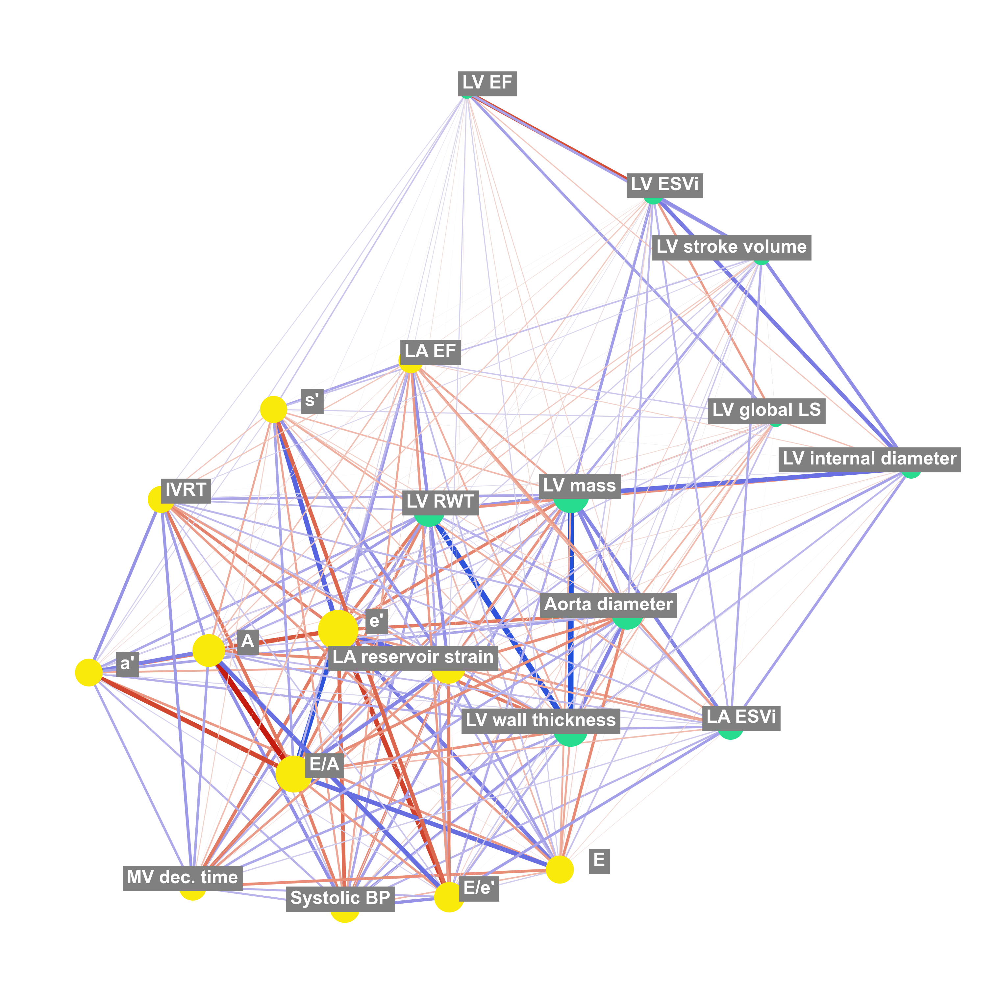

In [25]:
X_formatted = X.copy()
X_formatted.columns = map(format_feature_short, X.columns)
adjacency_matrix = X_formatted.corr()

nodes = list(X_formatted.columns)
graph = get_graph_low_threshold(adjacency_matrix, 0)
graph_position = spring_layout(graph, seed=5)
degree_centrality = dict(degree(graph, weight='weight'))
nodes = degree_centrality.keys()
max_weight = max(get_edge_attributes(graph, 'weight').values())

pyplot.figure(figsize=(15,15))
draw_graph(
    graph,
    graph_position,
    edge_width_scale=0.4,
    node_width_scale=1.5,
    box_background='gray',
    plot_parameters=dict(
        edge_cmap=colorcet.cm.coolwarm_r,
        edge_vmin=-max_weight,
        edge_vmax=max_weight,
    ),
    modules_colors=['#27DB8F', '#FAEA0C'],
    min_node_size=700,
)



## PCA

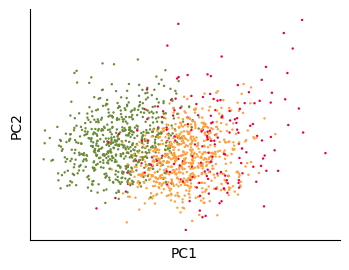

In [26]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn import decomposition

np.random.seed(5)


plt.style.use('default')


fig = plt.figure(1, figsize=(4, 3))
plt.clf()
ax = plt.gca()
plt.cla()

pca = decomposition.PCA(n_components=3)
pca.fit(X)

X_reduced = pca.transform(X)
y_pca = np.choose(partition_results['gaussian']['y_pred'], [1, 2, 0]).astype(float)
ax.scatter(X_reduced[:, 0], X_reduced[:, 1], c=[['#EB003F', '#6A8C39', '#FFA03C'][int(cluster)] for cluster in y_pca],
           edgecolor='k', s=3, linewidths=0)

plt.xlabel('PC1')
plt.ylabel('PC2')
plt.tick_params(
    axis='both',
    which='both',
    bottom=False,
    top=False,
    left=False,
    labelbottom=False, labelleft=False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['top'].set_visible(False)

plt.gca().set_facecolor('white')
savefig(f'{plot_folder}/pca.svg')
plt.show()